Copyright © [2024] [Saksham Adhikari]
All rights reserved.

In [ ]:
!pip install yfinance

In [ ]:
!pip install quantstats

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 1.3 MB/s eta 0:00:00


In [ ]:
!pip install pyportfolioopt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.9/61.9 kB 1.4 MB/s eta 0:00:00


In [ ]:
!pip install ta


  Preparing metadata (setup.py) ... done
  Created wheel for ta: filename=ta-0.11.0-py3-none-any.whl size=29411 sha256=f9a622cefe4deb2d4268d7059ce230943056a0be9349bd5f664ec240fe08be17
  Stored in directory: /root/.cache/pip/wheels/5f/67/4f/8a9f252836e053e532c6587a3230bc72a4deb16b03a829610b
Successfully built ta


In [ ]:
import pandas as pd
from pandas_datareader import data
import numpy as np
from scipy import stats

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Optimization and allocation
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns
from pypfopt import black_litterman, BlackLittermanModel

# Financial data
import quantstats as qs
import ta
import yfinance as yf

# Linear Regression Model
from sklearn.linear_model import LinearRegression
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

# Datetime and hiding warnings
import datetime as dt
import warnings
warnings.filterwarnings("ignore")

In [ ]:
nvda = qs.utils.download_returns('NVDA')
nvda = nvda.loc['2010-07-01':'2024-03-02']

aapl = qs.utils.download_returns('AAPL')
aapl = aapl.loc['2010-07-01':'2024-03-02']

msft = qs.utils.download_returns('MSFT')
msft = msft.loc['2010-07-01':'2024-03-02']

amzn = qs.utils.download_returns('AMZN')
amzn = amzn.loc['2010-07-01':'2024-03-02']

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [ ]:
nvda.index = nvda.index.tz_localize(None)
aapl.index = aapl.index.tz_localize(None)
msft.index = msft.index.tz_localize(None)
amzn.index = amzn.index.tz_localize(None)

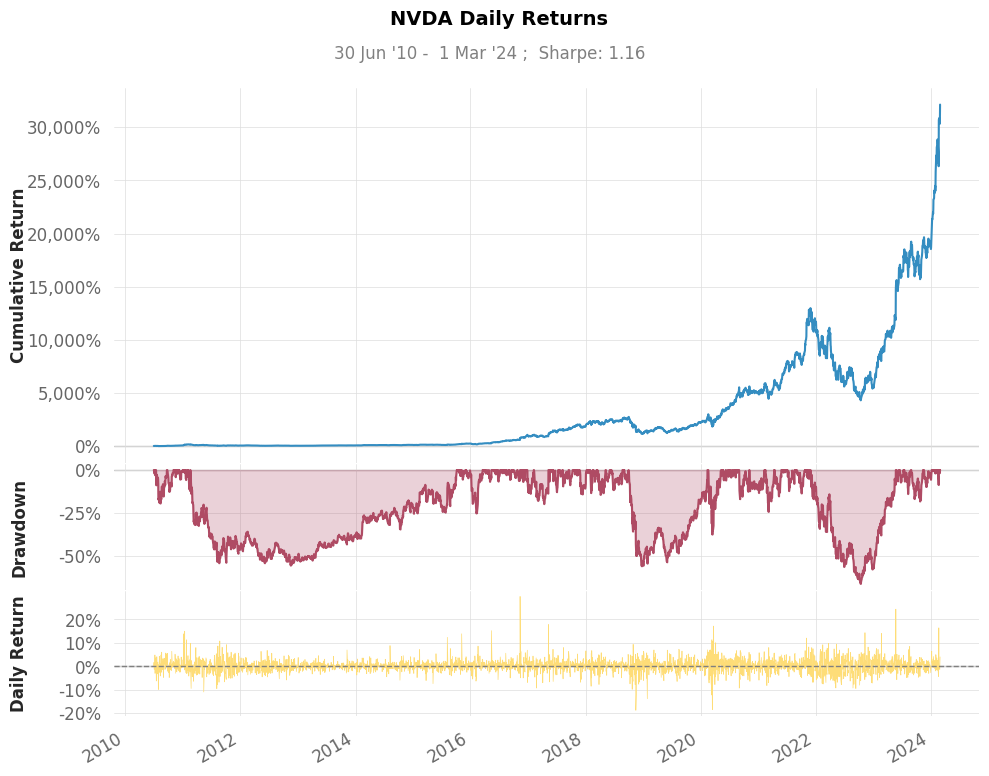

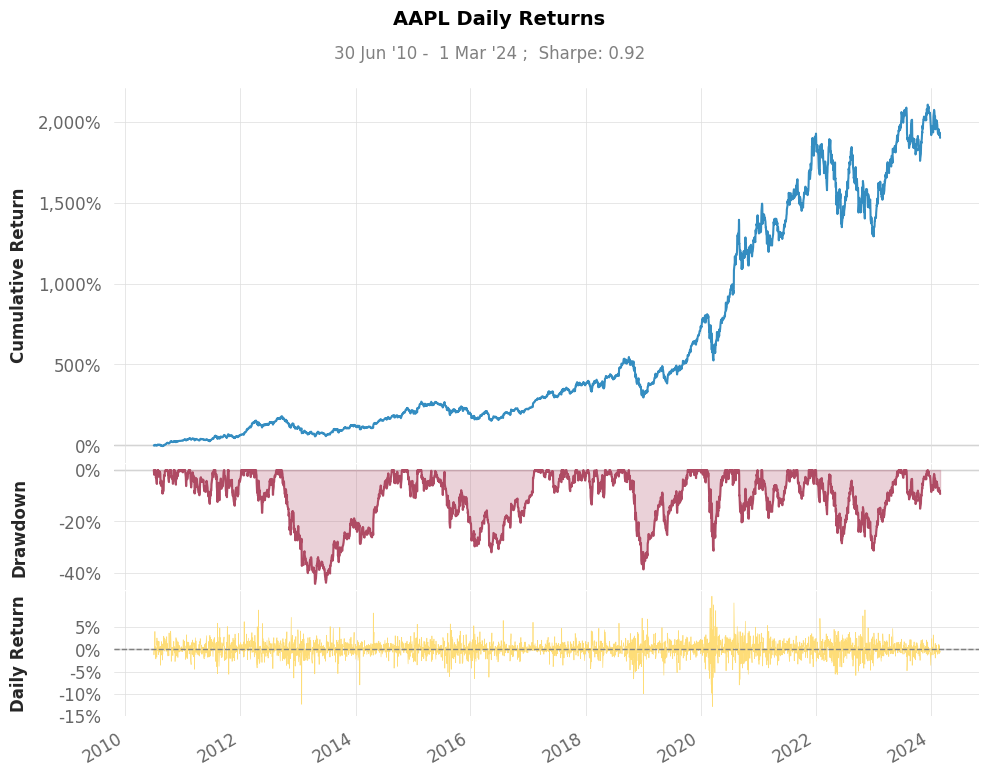

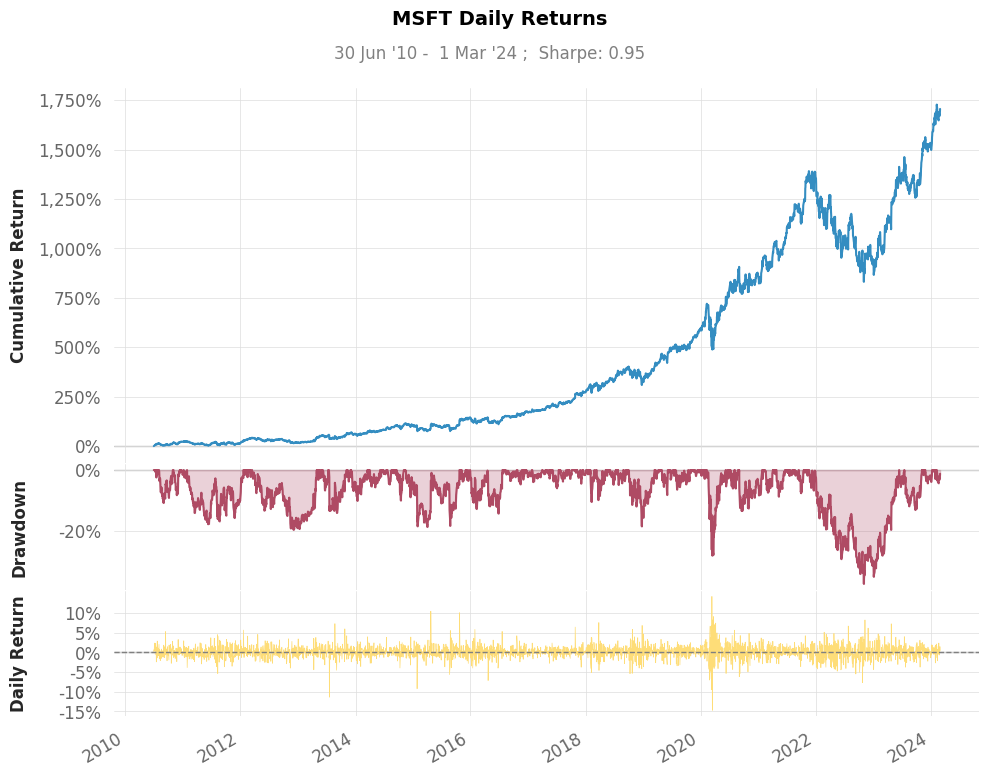

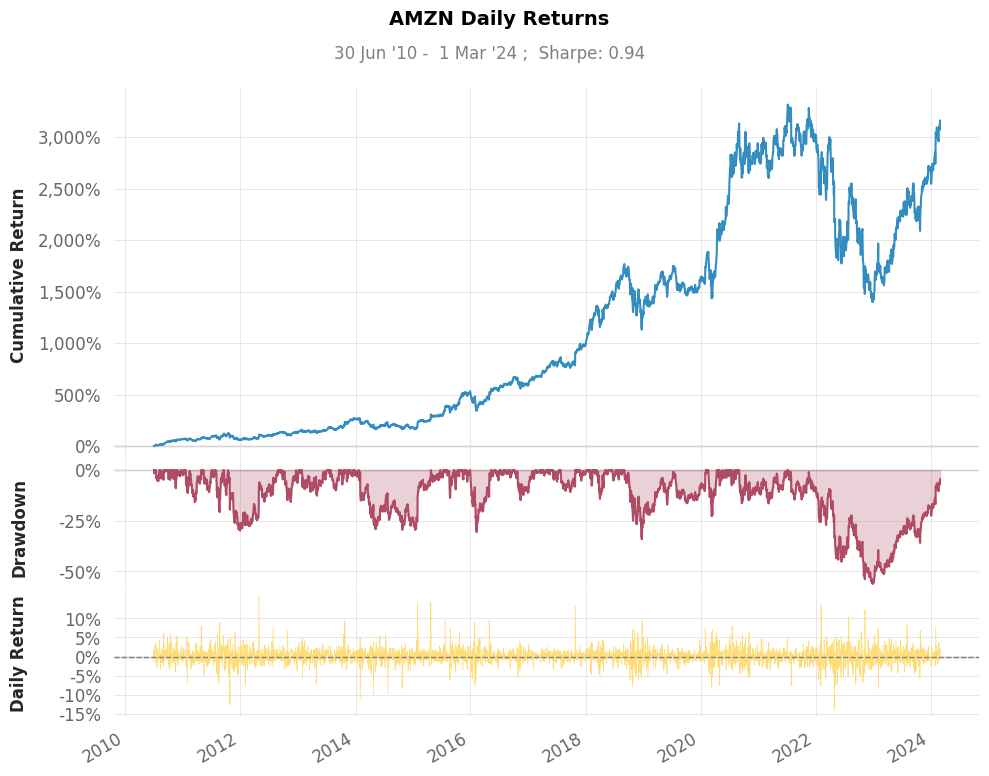

In [ ]:
# Plot daily returns using QuantStats
qs.plots.snapshot(nvda, title="NVDA Daily Returns")
qs.plots.snapshot(aapl, title="AAPL Daily Returns")
qs.plots.snapshot(msft, title="MSFT Daily Returns")
qs.plots.snapshot(amzn, title="AMZN Daily Returns")

NVDA : 9.098530710244443
AAPL : 5.380088951360213
MSFT : 7.822095081349172
AMZN :  6.544205528406113


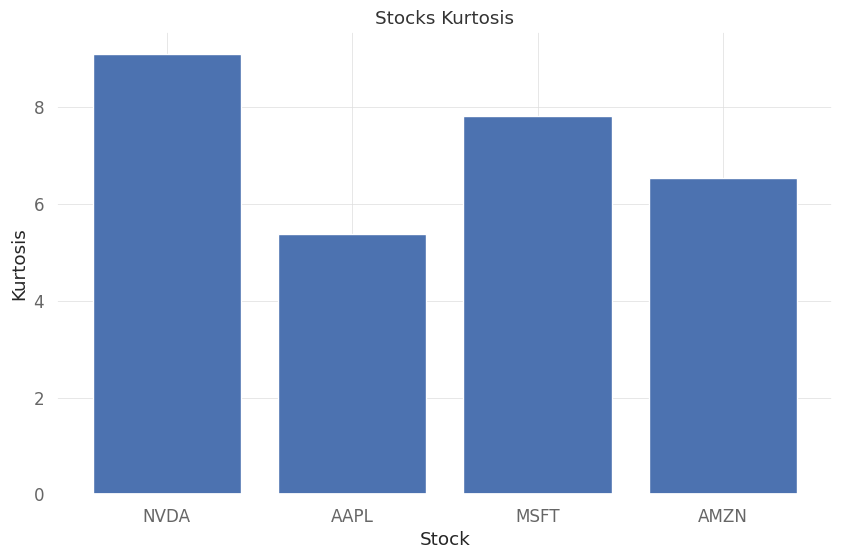

In [ ]:
# Calculate kurtosis
kurtosis_nvda = qs.stats.kurtosis(nvda)
kurtosis_aapl = qs.stats.kurtosis(aapl)
kurtosis_msft = qs.stats.kurtosis(msft)
kurtosis_amzn = qs.stats.kurtosis(amzn)

print("NVDA :" ,kurtosis_nvda)
print("AAPL :" ,kurtosis_aapl)
print ("MSFT :",kurtosis_msft)
print ('AMZN : ',kurtosis_amzn)


# Plot kurtosis
stocks = ['NVDA', 'AAPL', 'MSFT', 'AMZN']
kurtosis_values = [kurtosis_nvda, kurtosis_aapl, kurtosis_msft, kurtosis_amzn]

plt.bar(stocks, kurtosis_values)
plt.title('Stocks Kurtosis')
plt.xlabel('Stock')
plt.ylabel('Kurtosis')
plt.show()

Skewness NVDA: 0.7120461245265246
Skewness AAPL: -0.06412751128963619
Skewness MSFT: 0.06011107218214345
Skewness AMZN: 0.3097175861733701


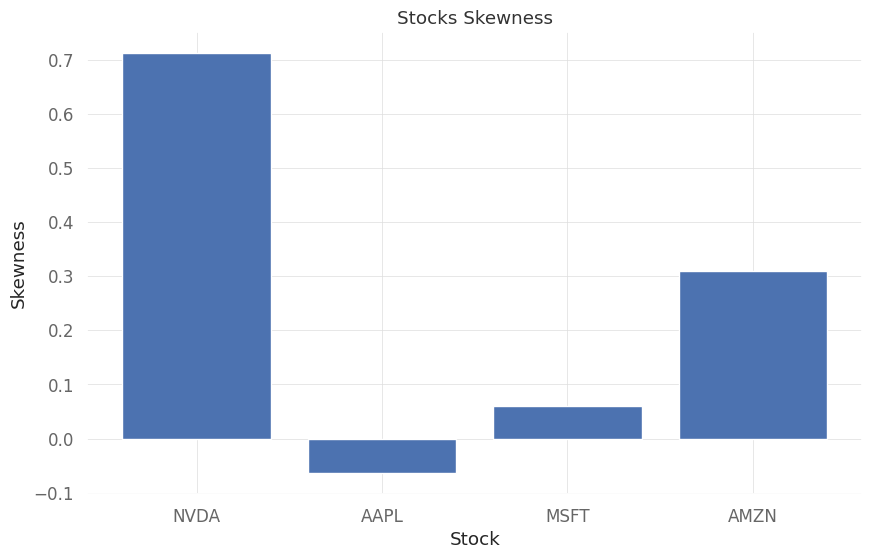

In [ ]:
# Calculate skewness
skewness_nvda = qs.stats.skew(nvda)
skewness_aapl = qs.stats.skew(aapl)
skewness_msft = qs.stats.skew(msft)
skewness_amzn = qs.stats.skew(amzn)

# Output skewness
print("Skewness NVDA:", skewness_nvda)
print("Skewness AAPL:", skewness_aapl)
print("Skewness MSFT:", skewness_msft)
print("Skewness AMZN:", skewness_amzn)

# Plot skewness
stocks = ['NVDA', 'AAPL', 'MSFT', 'AMZN']
skewness_values = [skewness_nvda, skewness_aapl, skewness_msft, skewness_amzn]

plt.bar(stocks, skewness_values)
plt.title('Stocks Skewness')
plt.xlabel('Stock')
plt.ylabel('Skewness')
plt.show()

NVDA Skewness: 0.7120461245265246
AAPL Skewness: -0.06412751128963619
MSFT Skewness: 0.06011107218214345
AMZN Skewness: 0.3097175861733701


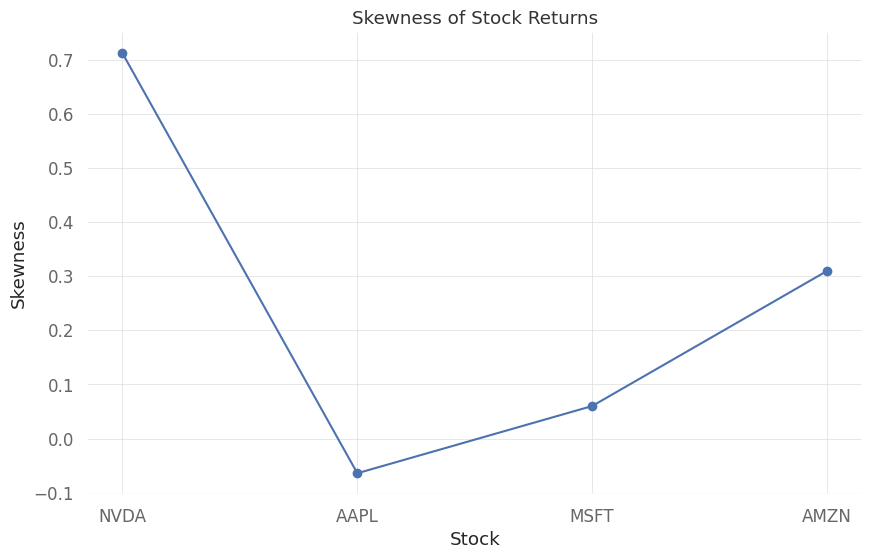

In [ ]:
skew_nvda = qs.stats.skew(nvda)
skew_aapl = qs.stats.skew(aapl)
skew_msft = qs.stats.skew(msft)
skew_amzn = qs.stats.skew(amzn)

# Output skewness
print(f"NVDA Skewness: {skew_nvda}")
print(f"AAPL Skewness: {skew_aapl}")
print(f"MSFT Skewness: {skew_msft}")
print(f"AMZN Skewness: {skew_amzn}")

# Plot skewness curves
plt.figure(figsize=(10, 6))
plt.plot(['NVDA', 'AAPL', 'MSFT', 'AMZN'], [skew_nvda, skew_aapl, skew_msft, skew_amzn], marker='o')
plt.title('Skewness of Stock Returns')
plt.xlabel('Stock')
plt.ylabel('Skewness')
plt.grid(True)
plt.show()

In [ ]:
std_dev = {
    "NVDA": nvda.std(),
    "AAPL": aapl.std(),
    "MSFT": msft.std(),
    "AMZN": amzn.std()
}

mean = {
    "NVDA": nvda.mean(),
    "AAPL": aapl.mean(),
    "MSFT": msft.mean(),
    "AMZN": amzn.mean()
}


# Create DataFrame
data = pd.DataFrame({
    "Stock": ["NVDA", "AAPL", "MSFT", "AMZN"],
    "Standard Deviation": [std_dev["NVDA"], std_dev["AAPL"], std_dev["MSFT"], std_dev["AMZN"]],
    "Mean": [mean["NVDA"], mean["AAPL"], mean["MSFT"], mean["AMZN"]]
})

# Output table
data

,Stock,Standard Deviation,Mean
0,NVDA,0.028337,0.002077
1,AAPL,0.017629,0.001027
2,MSFT,0.016341,0.000975
3,AMZN,0.020727,0.001228


In [ ]:
merged_daily_returns = pd.concat([nvda, aapl, msft, amzn], axis=1, keys=['NVDA', 'AAPL', 'MSFT', 'AMZN'])


In [ ]:
merged_daily_returns

,NVDA,AAPL,MSFT,AMZN
Date,,,,
2010-07-01,0.016650,-0.012126,0.006519,0.015559
2010-07-02,-0.012524,-0.006198,0.004750,-0.016402
2010-07-06,-0.010732,0.006844,0.023636,0.008430
2010-07-07,0.048323,0.040381,0.020151,0.030620
2010-07-08,-0.030103,-0.002242,0.004527,0.024597
...,...,...,...,...
2024-02-26,0.003489,-0.007451,-0.006824,-0.001486
2024-02-27,-0.004944,0.008114,-0.000147,-0.006811
2024-02-28,-0.013189,-0.006625,0.000589,-0.002190


In [ ]:
merged_df = merged_daily_returns

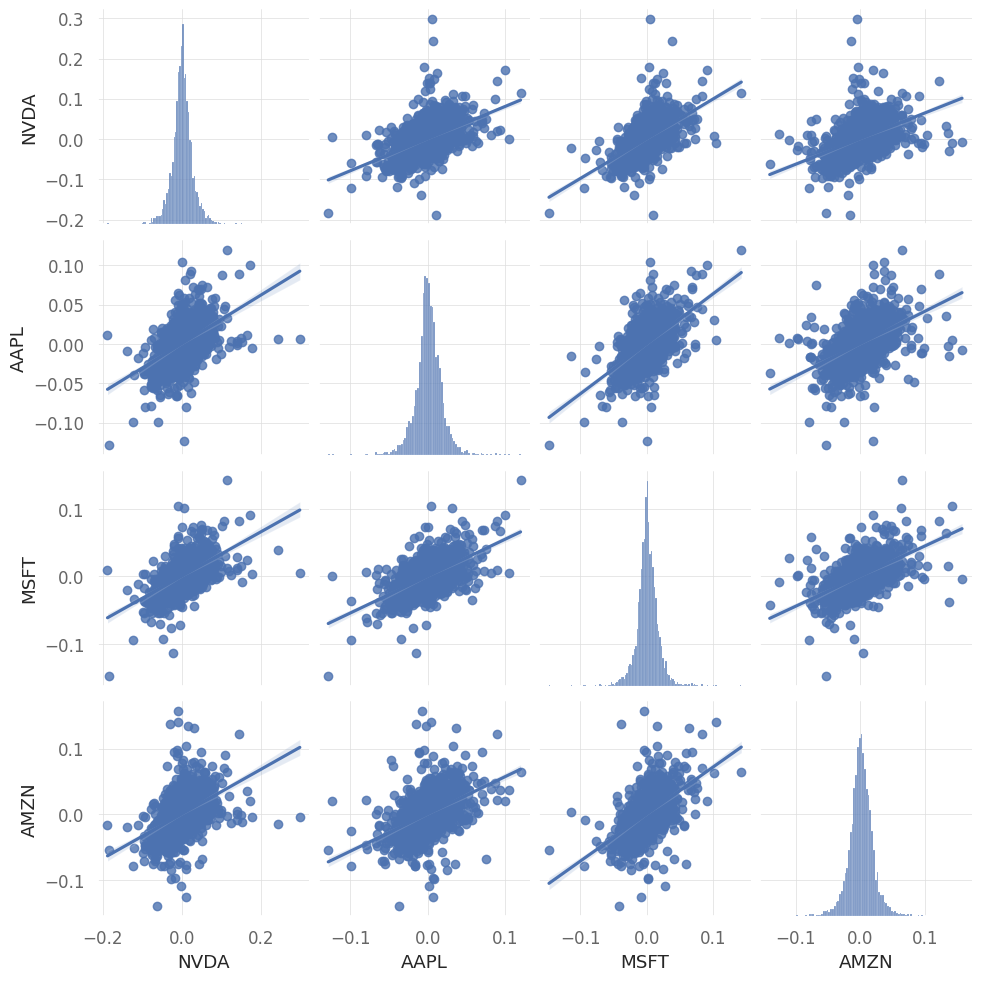

In [ ]:
sns.pairplot(merged_df, kind = 'reg')
plt.show()

In [ ]:
sp500 = qs.utils.download_returns('^GSPC')
sp500 = sp500.loc['2010-07-01':'2024-03-02']
sp500.index = sp500.index.tz_localize(None)
sp500

[*********************100%%**********************]  1 of 1 completed


Date
2010-07-01   -0.003240
2010-07-02   -0.004662
2010-07-06    0.005359
2010-07-07    0.031331
2010-07-08    0.009413
                ...   
2024-02-26   -0.003787
2024-02-27    0.001706
2024-02-28   -0.001658
2024-02-29    0.005229
2024-03-01    0.008008
Name: Close, Length: 3440, dtype: float64

In [ ]:
sp500_no_index = sp500.reset_index(drop = True)
aapl_no_index = aapl.reset_index(drop = True)
nvda_no_index = nvda.reset_index(drop = True)
msft_no_index = msft.reset_index(drop = True)
amzn_no_index = amzn.reset_index(drop = True)

In [ ]:
sp500_no_index

0      -0.003240
1      -0.004662
2       0.005359
3       0.031331
4       0.009413
          ...   
3435   -0.003787
3436    0.001706
3437   -0.001658
3438    0.005229
3439    0.008008
Name: Close, Length: 3440, dtype: float64

In [ ]:
X = sp500_no_index.values.reshape(-1,1)
y = aapl_no_index.values.reshape(-1,1)

linreg = LinearRegression().fit(X, y)

beta = linreg.coef_[0]
alpha = linreg.intercept_
print('\n')
print('AAPL beta: ', beta.round(3))
print('\nAAPL alpha: ', alpha.round(3))



AAPL beta:  [1.11]

AAPL alpha:  [0.]


In [ ]:
np.random.seed(0)  # For reproducibility
sp500_no_index = pd.Series(np.random.randn(100))
nvda_no_index = sp500_no_index * 1.5 + np.random.randn(100) * 0.5
aapl_no_index = sp500_no_index * 1.2 + np.random.randn(100) * 0.5
msft_no_index = sp500_no_index * 1.3 + np.random.randn(100) * 0.5
amzn_no_index = sp500_no_index * 1.4 + np.random.randn(100) * 0.5

# Define a function to compute alpha and beta using the specified attribute access
def compute_alpha_beta(X, y):
    linreg = LinearRegression().fit(X, y)
    beta = linreg.coef_[0]
    alpha = linreg.intercept_
    return alpha, beta

# Calculate alpha and beta for each stock
alphas_betas = []
for stock_no_index in [nvda_no_index, aapl_no_index, msft_no_index, amzn_no_index]:
    X = sp500_no_index.values.reshape(-1,1)
    y = stock_no_index.values.reshape(-1,1)
    alpha, beta = compute_alpha_beta(X, y)
    alphas_betas.append((alpha, beta))

# Creating a DataFrame to display alpha and beta
stocks = ['NVDA', 'AAPL', 'MSFT', 'AMZN']
results_df = pd.DataFrame(alphas_betas, columns=['Alpha', 'Beta'], index=stocks)

# Print the results in a table
results_df

,Alpha,Beta
NVDA,[0.03757654252625718],[1.5573492167731897]
AAPL,[-0.03176610536786364],[1.235947942241829]
MSFT,[-0.0967469988226766],[1.272389078027068]
AMZN,[-0.0053323454136097875],[1.3841198124137455]


In [ ]:
sharpe_nvda = qs.stats.sharpe(nvda)
sharpe_aapl = qs.stats.sharpe(aapl)
sharpe_msft = qs.stats.sharpe(msft)
sharpe_amzn = qs.stats.sharpe(amzn)

In [ ]:
stocks = ['NVDA', 'AAPL', 'MSFT', 'AMZN']
sharpe_ratios = [sharpe_nvda, sharpe_aapl, sharpe_msft, sharpe_amzn]
sharpe_df = pd.DataFrame(sharpe_ratios, index=stocks, columns=['Sharpe Ratio'])


In [ ]:
sharpe_df

,Sharpe Ratio
NVDA,1.163693
AAPL,0.924520
MSFT,0.947132
AMZN,0.940190


In [ ]:
weights = [0.25, 0.25, 0.25, 0.25]

In [ ]:
portfolio = nvda*weights[0] + aapl*weights[1] + msft*weights[2] + amzn*weights[3]

In [ ]:
portfolio

Date
2010-07-01    0.006651
2010-07-02   -0.007594
2010-07-06    0.007044
2010-07-07    0.034869
2010-07-08   -0.000806
                ...   
2024-02-26   -0.003068
2024-02-27   -0.000947
2024-02-28   -0.005354
2024-02-29    0.012569
2024-03-01    0.011689
Name: Strategy, Length: 3440, dtype: float64

[Performance Metrics]



                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2010-07-01   2010-07-01
End Period                 2024-03-01   2024-03-01
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          398.40%      5,824.45%
CAGR﹪                     8.45%        22.88%

Sharpe                     0.77         1.26
Prob. Sharpe Ratio         99.73%       100.0%
Smart Sharpe               0.71         1.17
Sortino                    1.07         1.86
Smart Sortino              0.99         1.72
Sortino/√2                 0.76         1.31
Smart Sortino/√2           0.7          1.21
Omega                      1.25         1.25

Max Drawdown               -33.92%      -42.27%
Longest DD Days            745          551
Volatility (ann.)          17.34%       26.5%
R^2                        0.67         0.67
Information Ratio          0.08         0.08
Calmar           

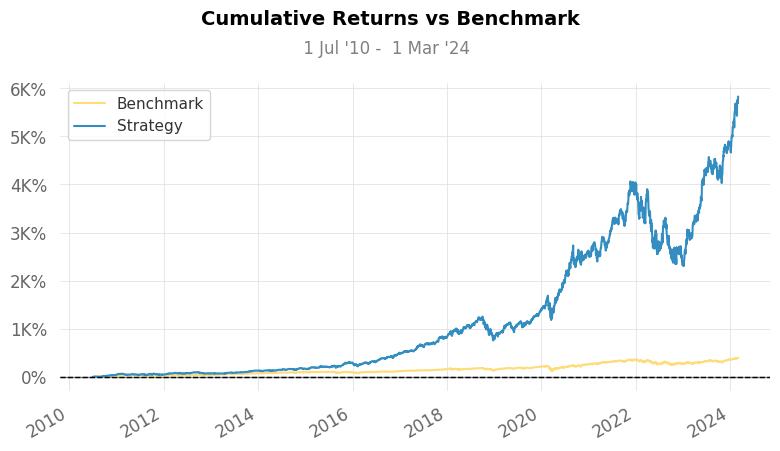

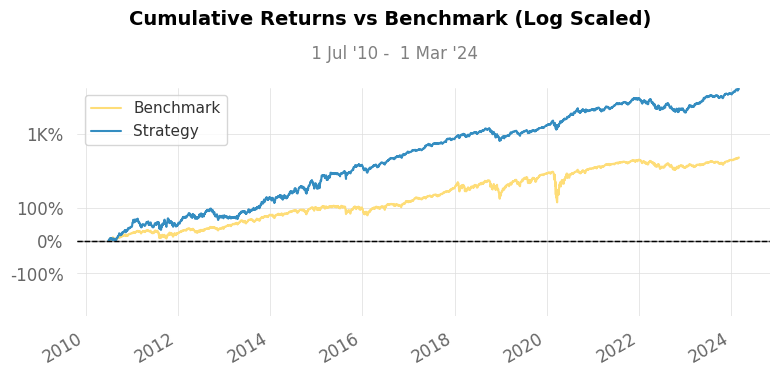

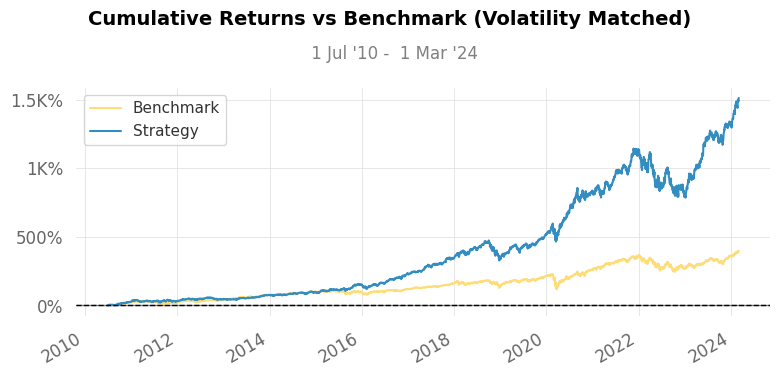

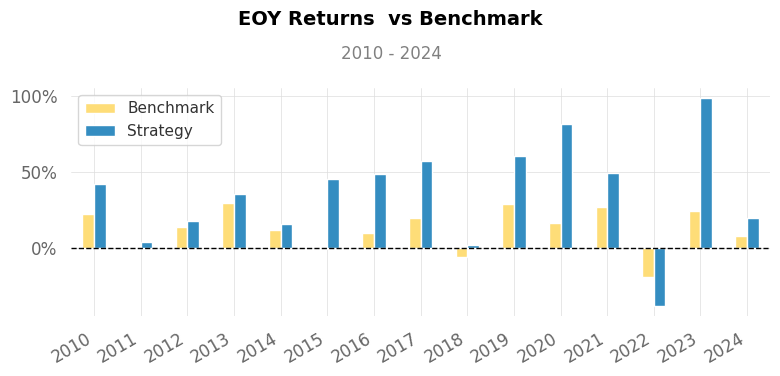

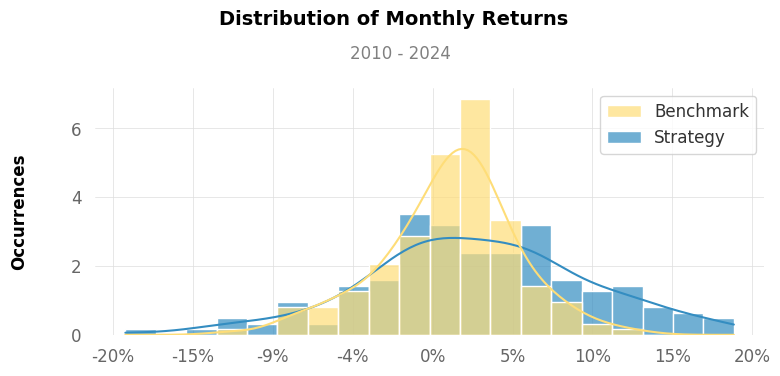

...

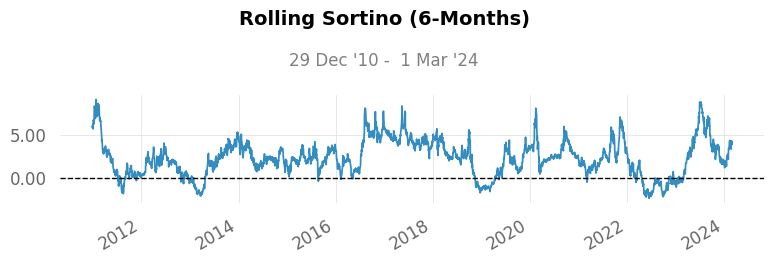

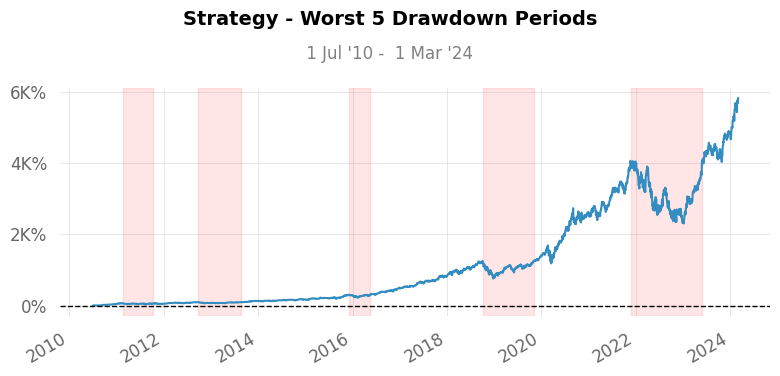

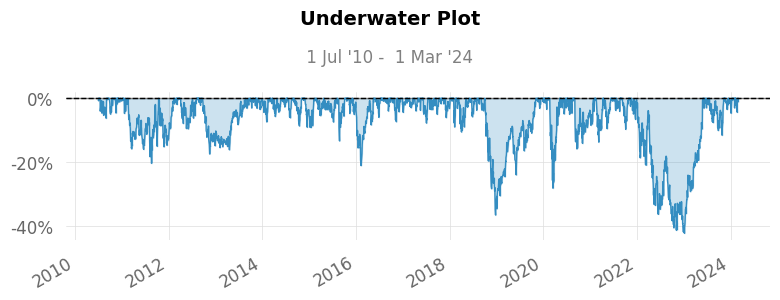

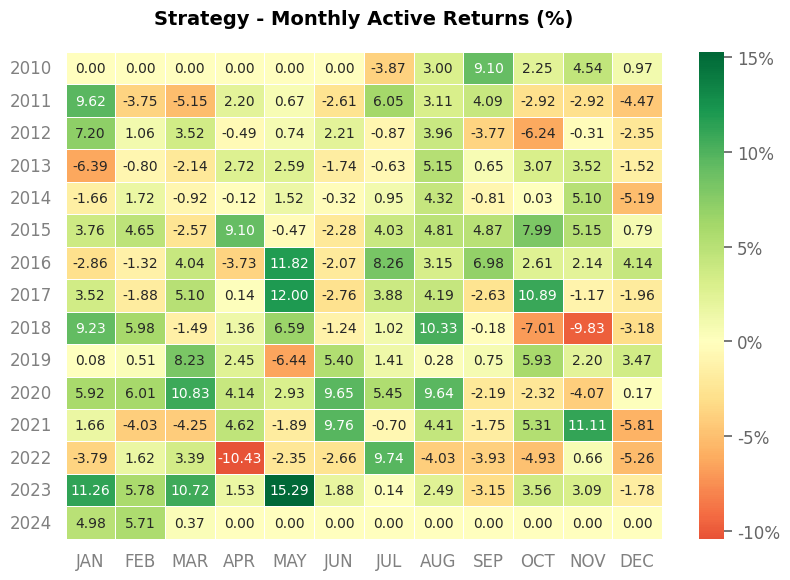

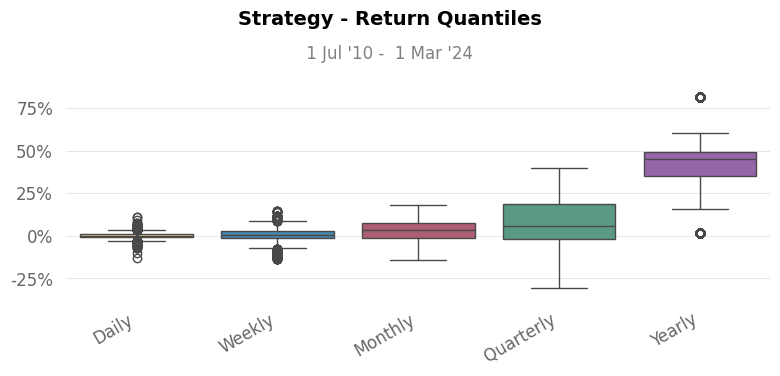

In [ ]:
qs.reports.full(portfolio, benchmark = sp500)


In [ ]:
aapl_df = yf.download('AAPL', start = '2010-07-01', end = '2024-03-02')
nvda_df = yf.download('NVDA', start = '2010-07-01', end = '2024-03-02')
msft_df = yf.download('MSFT', start = '2010-07-01', end = '2024-03-02')
amzn_df = yf.download('AMZN', start = '2010-07-01', end = '2024-03-02')

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


In [ ]:
aapl_df = aapl_df['Adj Close']
nvda_df = nvda_df['Adj Close']
msft_df = msft_df['Adj Close']
amzn_df = amzn_df['Adj Close']

In [ ]:
df = pd.concat([aapl_df, nvda_df, msft_df, amzn_df], join = 'outer', axis = 1)
df.columns = ['AAPL', 'NVDA', 'MSFT', 'AMZN']

In [ ]:
df

,AAPL,NVDA,MSFT,AMZN
Date,,,,
2010-07-01,7.512966,2.380399,17.695429,5.548000
2010-07-02,7.466403,2.350587,17.779467,5.457000
2010-07-06,7.517500,2.325361,18.199705,5.503000
2010-07-07,7.821065,2.437730,18.566450,5.671500
2010-07-08,7.803528,2.364347,18.650482,5.811000
...,...,...,...,...
2024-02-26,181.160004,790.882874,407.540009,174.729996
2024-02-27,182.630005,786.973083,407.480011,173.539993
2024-02-28,181.419998,776.593567,407.720001,173.160004


In [ ]:
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

In [ ]:
mu = expected_returns.mean_historical_return(df, compounding= True, frequency=252) #expected returns
S = risk_models.sample_cov(df)

In [ ]:
mu

AAPL    0.261894
NVDA    0.534697
MSFT    0.260206
AMZN    0.289482
dtype: float64

In [ ]:
S

,AAPL,NVDA,MSFT,AMZN
AAPL,0.078247,0.062645,0.042890,0.044523
NVDA,0.062645,0.202360,0.066444,0.068943
MSFT,0.042890,0.066444,0.067153,0.048256
AMZN,0.044523,0.068943,0.048256,0.108273


In [ ]:
ef = EfficientFrontier(mu, S) # Providing expected returns and covariance matrix as input
weights = ef.max_sharpe() # Optimizing weights for Sharpe ratio maximization

clean_weights = ef.clean_weights() # clean_weights rounds the weights and clips near-zeros

# Printing optimized weights and expected performance for portfolio
clean_weights

OrderedDict([('AAPL', 0.20851),
             ('NVDA', 0.44149),
             ('MSFT', 0.19363),
             ('AMZN', 0.15637)])

In [ ]:
new_weights = [0.20851, 0.44149, 0.19363, 0.15637]
optimized_portfolio = aapl*new_weights[0] + nvda*new_weights[1]
optimized_portfolio

Date
2010-07-01    0.004823
2010-07-02   -0.006822
2010-07-06   -0.003311
2010-07-07    0.029754
2010-07-08   -0.013758
                ...   
2024-02-26   -0.000013
2024-02-27   -0.000491
2024-02-28   -0.007204
2024-02-29    0.007467
2024-03-01    0.016416
Name: Strategy, Length: 3440, dtype: float64

[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2010-07-01   2010-07-01
End Period                 2024-03-01   2024-03-01
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          5,824.45%    3,277.76%
CAGR﹪                     22.88%       19.44%

Sharpe                     1.26         1.22
Prob. Sharpe Ratio         100.0%       100.0%
Smart Sharpe               1.19         1.15
Sortino                    1.86         1.87
Smart Sortino              1.75         1.76
Sortino/√2                 1.31         1.32
Smart Sortino/√2           1.24         1.24
Omega                      1.25         1.25

Max Drawdown               -42.27%      -37.81%
Longest DD Days            551          1098
Volatility (ann.)          26.5%        23.32%
R^2                        0.82         0.82
Information Ratio          -0.03     

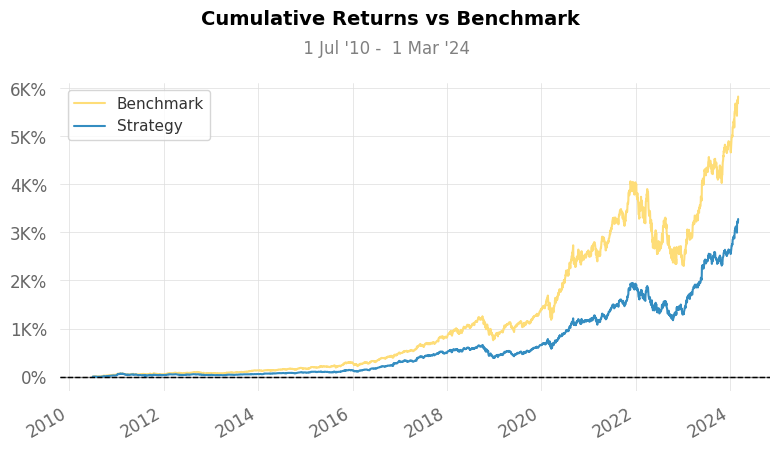

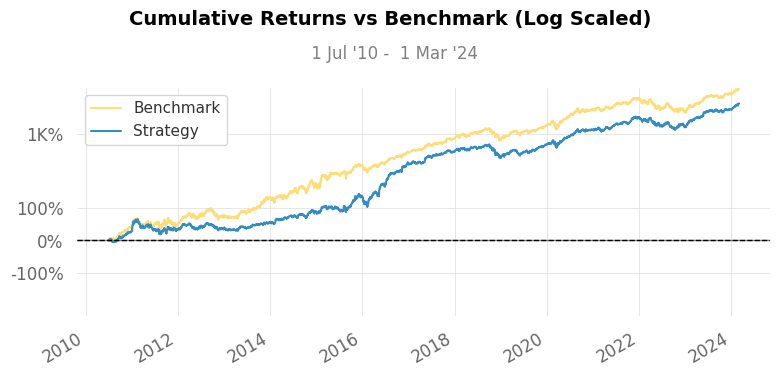

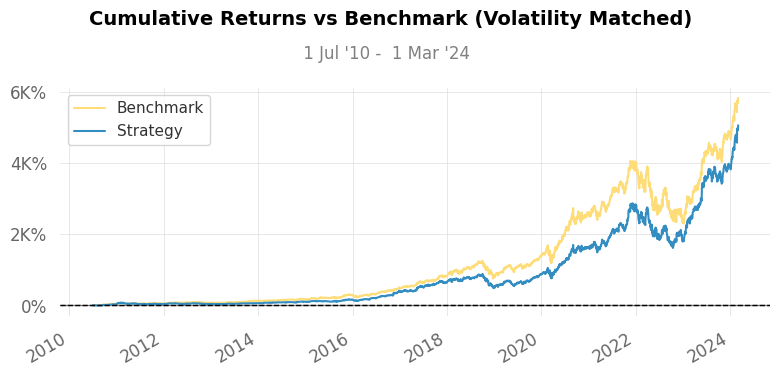

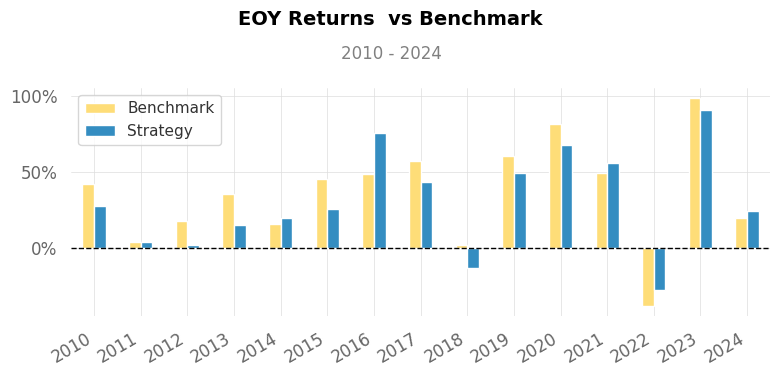

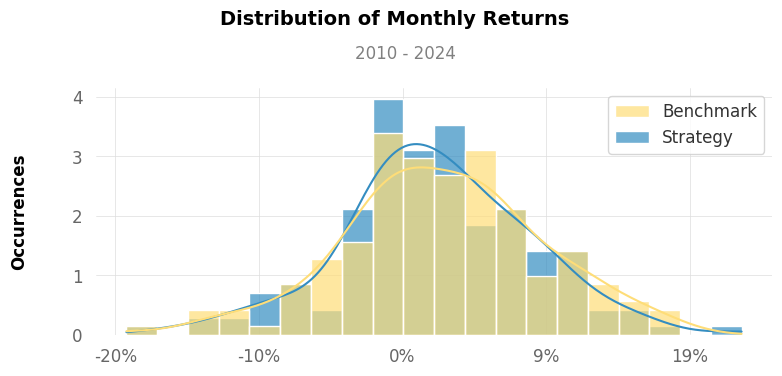

...

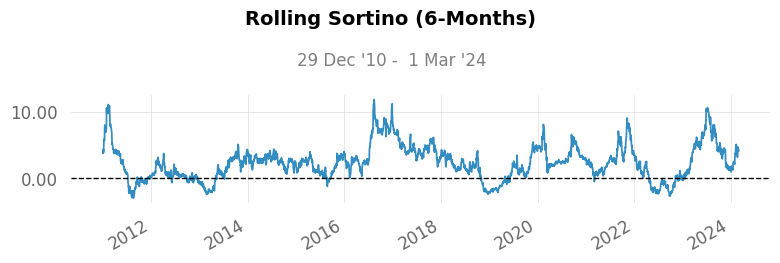

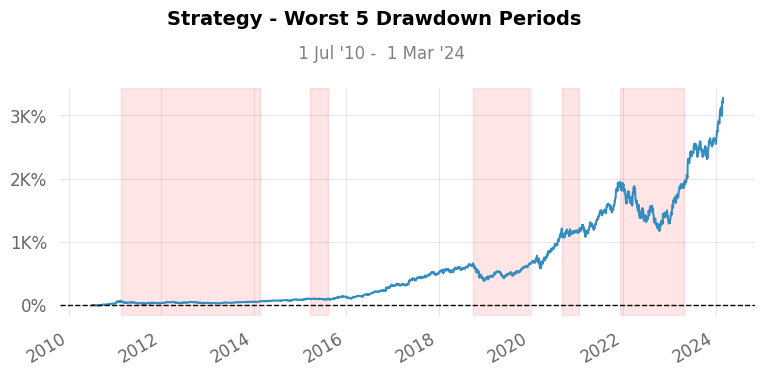

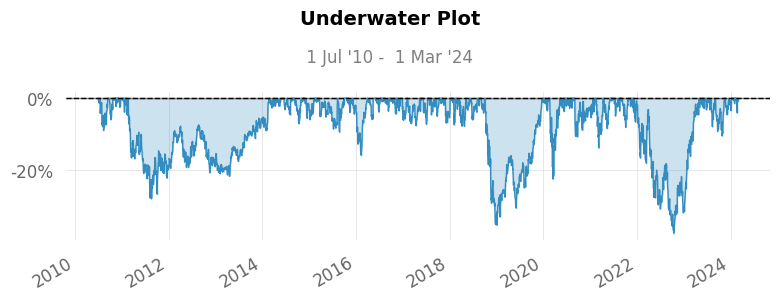

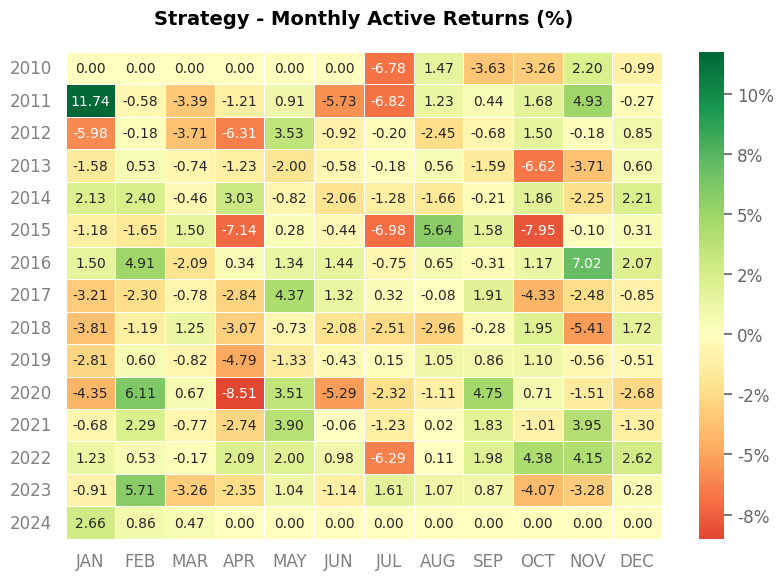

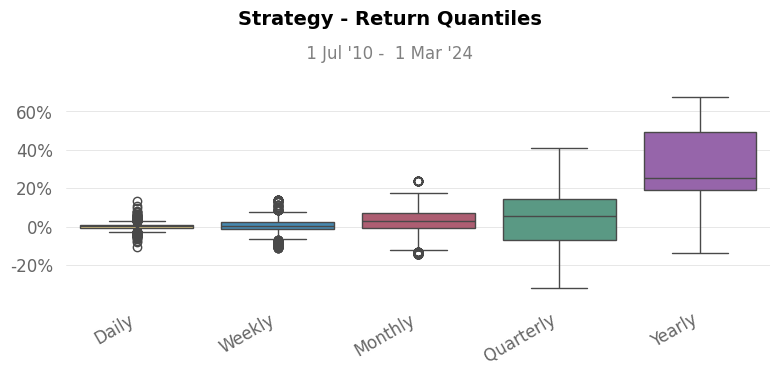

In [ ]:
qs.reports.full(optimized_portfolio, benchmark = portfolio)

In [ ]:
assets = ['AAPL', 'NVDA', 'MSFT', 'AMZN']

In [ ]:
data = yf.Tickers(assets)


In [ ]:
market_caps = {asset: data.tickers[asset].info['marketCap'] for asset in assets}

In [ ]:
market_caps_df = pd.DataFrame(list(market_caps.items()), columns=['Asset', 'Market Cap'])

market_caps_df

,Asset,Market Cap
0,AAPL,2637630799872
1,NVDA,2225124933632
2,MSFT,3094851616768
3,AMZN,1816444534784


In [ ]:
import yfinance as yf

# Download S&P 500 Index adjusted closing prices
market_prices = yf.download("^GSPC", start='2010-07-01', end='2024-03-02')['Adj Close']

# Display the data
print(market_prices)


[*********************100%%**********************]  1 of 1 completed

Date
2010-07-01    1027.369995
2010-07-02    1022.580017
2010-07-06    1028.060059
2010-07-07    1060.270020
2010-07-08    1070.250000
                 ...     
2024-02-26    5069.529785
2024-02-27    5078.180176
2024-02-28    5069.759766
2024-02-29    5096.270020
2024-03-01    5137.080078
Name: Adj Close, Length: 3440, dtype: float64


In [ ]:
delta = black_litterman.market_implied_risk_aversion(market_prices)
delta

3.758227434599922

In [ ]:
S

,AAPL,NVDA,MSFT,AMZN
AAPL,0.078247,0.062645,0.042890,0.044523
NVDA,0.062645,0.202360,0.066444,0.068943
MSFT,0.042890,0.066444,0.067153,0.048256
AMZN,0.044523,0.068943,0.048256,0.108273


In [ ]:
prior = black_litterman.market_implied_prior_returns(market_caps, delta, S)
prior

AAPL    0.235093
NVDA    0.383892
MSFT    0.233965
AMZN    0.257189
dtype: float64

In [ ]:
Q = np.array([0.05, 0.10, 0.02])

In [ ]:
P = np.array([
    [1,0,0,0], # APPL = 0.05
    [0,1,0,0], # NVDA = 0.10
    [0,0,-1,1] # AMZN > MSFT by 0.02
])

In [ ]:
confidences = [0.5,
               0.8,
               0.3]


In [ ]:
bl = BlackLittermanModel(S, # Covariance Matrix
                         pi = prior, # Prior expected returns
                         Q = Q, # Vector of views
                         P = P, # Matrix mapping the views
                         omega = 'idzorek', # Method to estimate uncertainty level of the views based on historical data
                         view_confidences = confidences)

In [ ]:
rets = bl.bl_returns() # Calculating Expected returns
ef = EfficientFrontier(rets, S)

In [ ]:
ef.max_sharpe() # Optimizing weights for maximal Sharpe ratio
weights = ef.clean_weights() # Cleaning weights
weights # Printing weights

OrderedDict([('AAPL', 0.08851),
             ('NVDA', 0.0),
             ('MSFT', 0.57087),
             ('AMZN', 0.34062)])

In [ ]:
black_litterman_weights = [0.62588,
                          0.19951,
                          0.016,
                          0.15861]
black_litterman_portfolio = aapl*black_litterman_weights[0] + nvda*black_litterman_weights[1] + msft*black_litterman_weights[2] + amzn*black_litterman_weights[3]

In [ ]:
black_litterman_portfolio

Date
2010-07-01   -0.001695
2010-07-02   -0.008903
2010-07-06    0.003857
2010-07-07    0.040094
2010-07-08   -0.003436
                ...   
2024-02-26   -0.004312
2024-02-27    0.003010
2024-02-28   -0.007116
2024-02-29    0.004941
2024-03-01    0.005594
Name: Strategy, Length: 3440, dtype: float64

[Performance Metrics]

                           Benchmark    Strategy
-------------------------  -----------  ----------
Start Period               2010-07-01   2010-07-01
End Period                 2024-03-01   2024-03-01
Risk-Free Rate             0.0%         0.0%
Time in Market             100.0%       100.0%

Cumulative Return          5,824.45%    4,678.85%
CAGR﹪                     22.88%       21.56%

Sharpe                     1.26         1.19
Prob. Sharpe Ratio         100.0%       100.0%
Smart Sharpe               1.18         1.12
Sortino                    1.86         1.75
Smart Sortino              1.74         1.64
Sortino/√2                 1.31         1.24
Smart Sortino/√2           1.23         1.16
Omega                      1.23         1.23

Max Drawdown               -42.27%      -39.46%
Longest DD Days            551          581
Volatility (ann.)          26.5%        26.8%
R^2                        0.9          0.9
Information Ratio          -0.01        

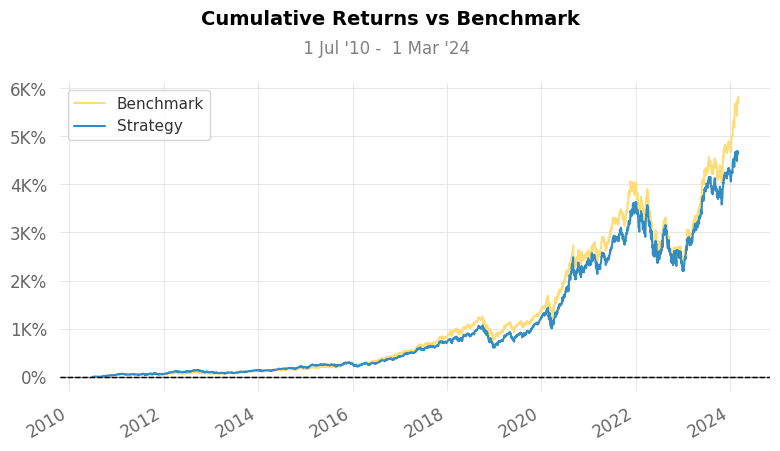

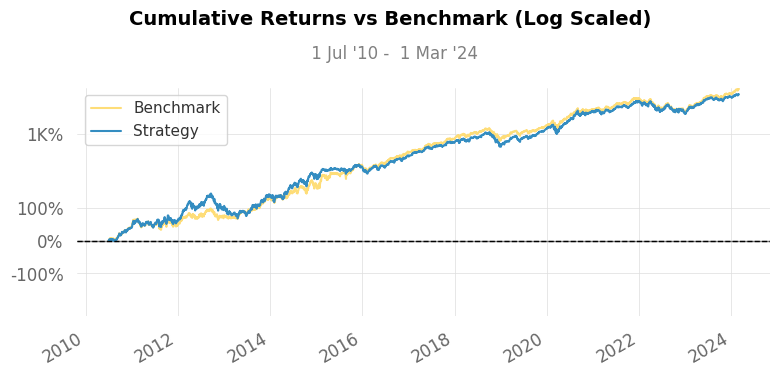

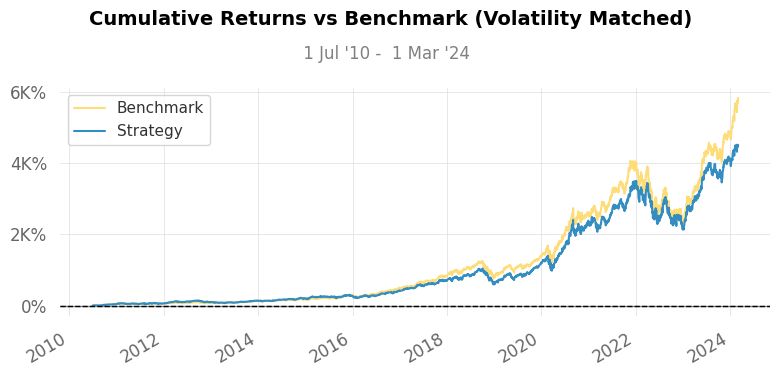

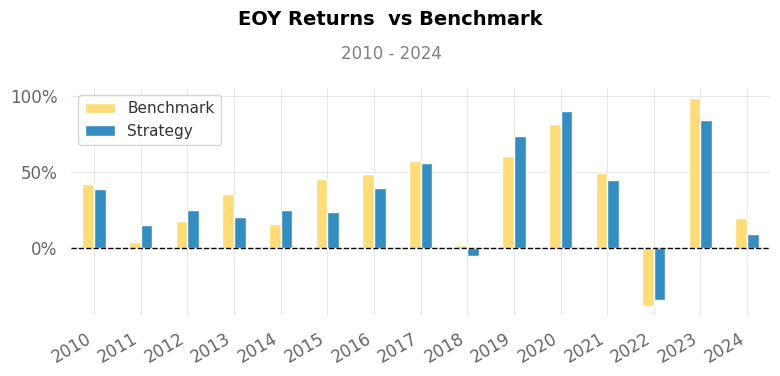

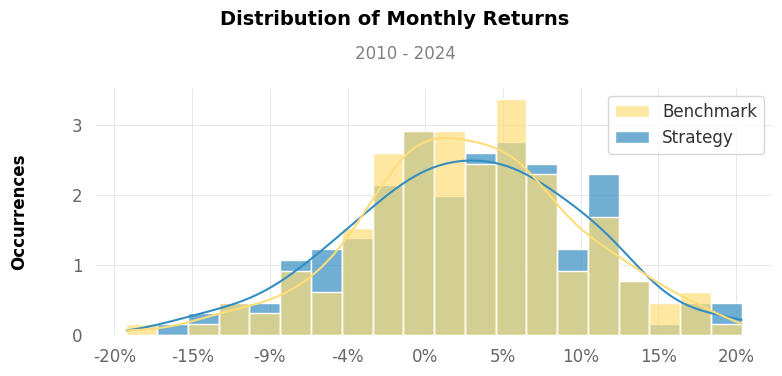

...

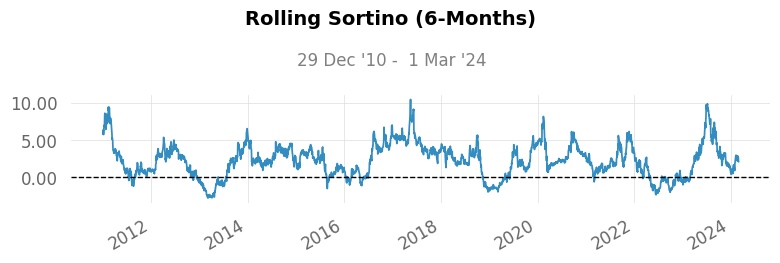

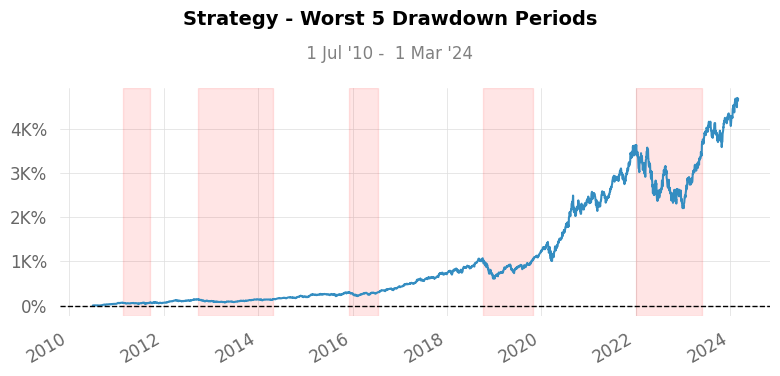

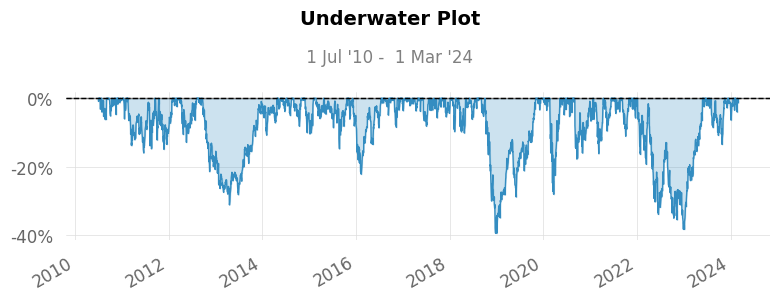

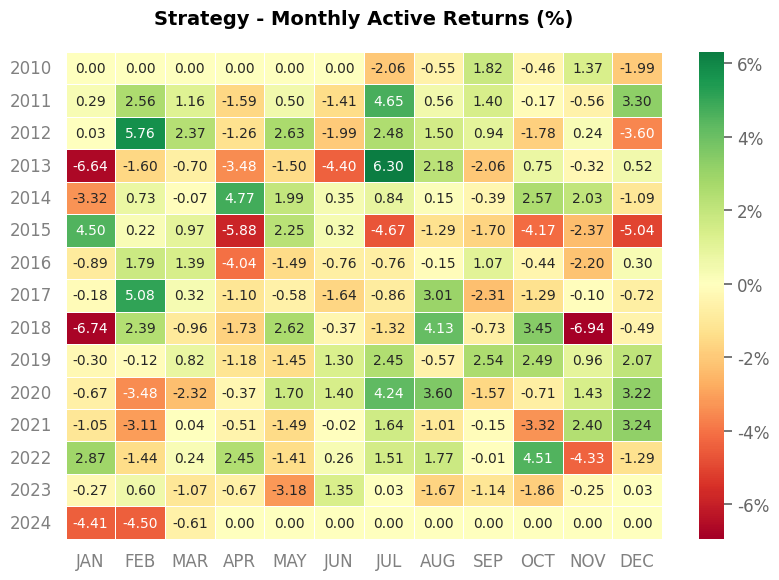

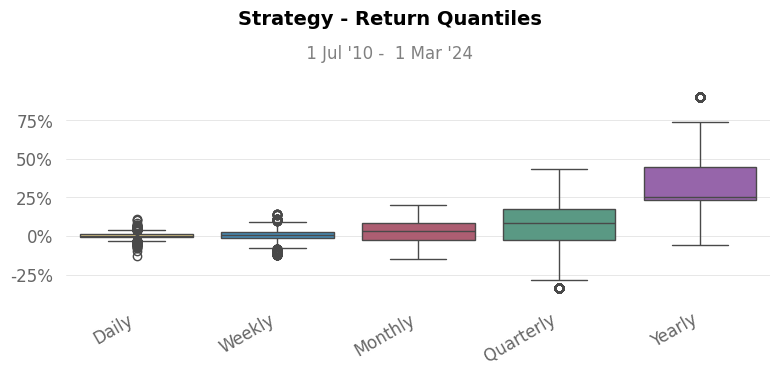

In [ ]:
qs.reports.full(black_litterman_portfolio, benchmark = portfolio)

In [ ]:
aapl = yf.download('AAPL', start = '2010-07-01', end = '2024-03-02')

[*********************100%%**********************]  1 of 1 completed


In [ ]:
aapl

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-07-01,9.082143,9.100000,8.686429,8.874286,7.512966,1022896000
2010-07-02,8.946071,8.961786,8.685714,8.819286,7.466403,693842800
2010-07-06,8.964286,9.028571,8.791429,8.879643,7.517500,615235600
2010-07-07,8.946071,9.241786,8.919643,9.238214,7.821065,654556000
2010-07-08,9.374286,9.389286,9.103214,9.217500,7.803528,738144400
...,...,...,...,...,...,...
2024-02-26,182.240005,182.759995,180.649994,181.160004,181.160004,40867400
2024-02-27,181.100006,183.919998,179.559998,182.630005,182.630005,54318900
2024-02-28,182.509995,183.119995,180.130005,181.419998,181.419998,48953900


In [ ]:
aapl['Open']

Date
2010-07-01      9.082143
2010-07-02      8.946071
2010-07-06      8.964286
2010-07-07      8.946071
2010-07-08      9.374286
                 ...    
2024-02-26    182.240005
2024-02-27    181.100006
2024-02-28    182.509995
2024-02-29    181.270004
2024-03-01    179.550003
Name: Open, Length: 3440, dtype: float64

In [ ]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.05, row_heights=[0.7, 0.3])

fig.add_trace(go.Candlestick(x=aapl.index,
                             open=aapl['Open'],
                             high=aapl['High'],
                             low=aapl['Low'],
                             close=aapl['Adj Close'],  # Adjust if necessary
                             name='AAPL'),
              row=1, col=1)

# Plotting volume chart on the second row
fig.add_trace(go.Bar(x=aapl.index,
                     y=aapl['Volume'],
                     name='Volume',
                     marker=dict(color='orange', opacity=1.0)),
              row=2, col=1)

# Plotting annotation
fig.add_annotation(text='Apple (AAPL)',
                   font=dict(color='white', size=20),  # Adjust font size if necessary
                   xref='paper', yref='paper',
                   x=0.5, y=0.65,
                   showarrow=False,
                   opacity=0.2)

fig.update_layout(title='AAPL Candlestick Chart From July 1st, 2010 to March 02, 2024',
                  yaxis=dict(title='Price (USD)'),
                  height=1000,
                  template='plotly_dark')

# Configuring axes and subplots
fig.update_xaxes(rangeslider_visible=False, row=1, col=1)
fig.update_xaxes(rangeslider_visible=False, row=2, col=1)
fig.update_yaxes(title_text='Price (USD)', row=1, col=1)
fig.update_yaxes(title_text='Volume', row=2, col=1)

fig.show()

fig.write_html("aapl_candlestick_chart.html")






In [ ]:
# Adding Moving Averages
aapl['EMA9'] = aapl['Adj Close'].ewm(span = 9, adjust = False).mean() # Exponential 9-Period Moving Average
aapl['SMA20'] = aapl['Adj Close'].rolling(window=20).mean() # Simple 20-Period Moving Average
aapl['SMA50'] = aapl['Adj Close'].rolling(window=50).mean() # Simple 50-Period Moving Average
aapl['SMA100'] = aapl['Adj Close'].rolling(window=100).mean() # Simple 100-Period Moving Average
aapl['SMA200'] = aapl['Adj Close'].rolling(window=200).mean() # Simple 200-Period Moving Average

# Adding RSI for 14-periods
delta = aapl['Adj Close'].diff() # Calculating delta
gain = delta.where(delta > 0,0) # Obtaining gain values
loss = -delta.where(delta < 0,0) # Obtaining loss values
avg_gain = gain.rolling(window=14).mean() # Measuring the 14-period average gain value
avg_loss = loss.rolling(window=14).mean() # Measuring the 14-period average loss value
rs = avg_gain/avg_loss # Calculating the RS
aapl['RSI'] = 100 - (100 / (1 + rs))
# Adding Bollinger Bands 20-periods
aapl['BB_UPPER'] = aapl['SMA20'] + 2*aapl['Adj Close'].rolling(window=20).std() # Upper Band
aapl['BB_LOWER'] = aapl['SMA20'] - 2*aapl['Adj Close'].rolling(window=20).std() # Lower Band

# Adding ATR 14-periods
aapl['TR'] = pd.DataFrame(np.maximum(np.maximum(aapl['High'] - aapl['Low'], abs(aapl['High'] - aapl['Adj Close'].shift())), abs(aapl['Low'] - aapl['Adj Close'].shift())), index = aapl.index)
aapl['ATR'] = aapl['TR'].rolling(window = 14).mean() # Creating an ART column to the Data Frame

In [ ]:
aapl.tail(50)

,Open,High,Low,Close,Adj Close,Volume,EMA9,SMA20,SMA50,SMA100,SMA200,RSI,BB_UPPER,BB_LOWER,TR,ATR
Date,,,,,,,,,,,,,,,,
2023-12-19,196.160004,196.949997,195.889999,196.940002,196.689026,40714100,195.498778,192.862902,184.173120,181.358629,177.401121,66.535599,199.024264,186.701540,1.309647,2.913526
2023-12-20,196.899994,197.679993,194.830002,194.830002,194.581711,52242800,195.315365,193.072135,184.506189,181.347673,177.620054,59.991817,199.164747,186.979523,2.849991,2.964954
2023-12-21,196.100006,197.080002,193.500000,194.679993,194.431885,46482500,195.138669,193.240420,184.808134,181.343587,177.831922,57.388250,199.285485,187.195355,3.580002,3.054240
2023-12-22,195.179993,195.410004,192.970001,193.600006,193.353287,37122800,194.781592,193.421689,185.070355,181.358895,178.049736,59.246155,199.236301,187.607076,2.440002,2.975219
2023-12-26,193.610001,193.889999,192.830002,193.050003,192.803986,28919300,194.386071,193.584482,185.358694,181.382754,178.275198,49.031937,199.117982,188.050982,1.059998,2.678689
2023-12-27,192.490005,193.500000,191.089996,193.149994,192.903839,48087700,194.089625,193.721806,185.651623,181.499051,178.491362,52.291487,199.028884,188.414729,2.410004,2.661547
2023-12-28,194.139999,194.660004,193.169998,193.580002,193.333298,34049900,193.938359,193.932038,185.984460,181.650919,178.699129,47.920398,198.786859,189.077218,1.756165,2.578053
2023-12-29,193.899994,194.399994,191.729996,192.529999,192.284637,42628800,193.607615,194.060874,186.322455,181.782838,178.899664,40.185187,198.568011,189.553737,2.669998,2.603052
2024-01-02,187.149994,188.440002,183.889999,185.639999,185.403412,82488700,191.966774,193.781230,186.530407,181.861981,179.051568,31.663427,199.593899,187.968561,8.394638,2.914056


In [ ]:
# Plotting Candlestick charts with indicators
fig = make_subplots(rows=4, cols=1, shared_xaxes=True, vertical_spacing=0.05,row_heights=[0.6, 0.10, 0.10, 0.20])

# Candlestick
fig.add_trace(go.Candlestick(x=aapl.index,
                             open=aapl['Open'],
                             high=aapl['High'],
                             low=aapl['Low'],
                             close=aapl['Adj Close'],
                             name='AAPL'),
              row=1, col=1)

# Moving Averages
fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['EMA9'],
                         mode='lines',
                         line=dict(color='#90EE90'),
                         name='EMA9'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['SMA20'],
                         mode='lines',
                         line=dict(color='yellow'),
                         name='SMA20'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['SMA50'],
                         mode='lines',
                         line=dict(color='orange'),
                         name='SMA50'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['SMA100'],
                         mode='lines',
                         line=dict(color='purple'),
                         name='SMA100'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['SMA200'],
                         mode='lines',
                         line=dict(color='red'),
                         name='SMA200'),
              row=1, col=1)

# Bollinger Bands
fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['BB_UPPER'],
                         mode='lines',
                         line=dict(color='#00BFFF'),
                         name='Upper Band'),
              row=1, col=1)

fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['BB_LOWER'],
                         mode='lines',
                         line=dict(color='#00BFFF'),
                         name='Lower Band'),
              row=1, col=1)

fig.add_annotation(text='Apple (AAPL)',
                    font=dict(color='white', size=40),
                    xref='paper', yref='paper',
                    x=0.5, y=0.65,
                    showarrow=False,
                    opacity=0.2)

# Relative Strengh Index (RSI)
fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['RSI'],
                         mode='lines',
                         line=dict(color='#CBC3E3'),
                         name='RSI'),
              row=2, col=1)

# Adding marking lines at 70 and 30 levels
fig.add_shape(type="line",
              x0=aapl.index[0], y0=70, x1=aapl.index[-1], y1=70,
              line=dict(color="red", width=2, dash="dot"),
              row=2, col=1)
fig.add_shape(type="line",
              x0=aapl.index[0], y0=30, x1=aapl.index[-1], y1=30,
              line=dict(color="#90EE90", width=2, dash="dot"),
              row=2, col=1)

# Average True Range (ATR)
fig.add_trace(go.Scatter(x=aapl.index,
                         y=aapl['ATR'],
                         mode='lines',
                         line=dict(color='#00BFFF'),
                         name='ATR'),
              row=3, col=1)

# Volume
fig.add_trace(go.Bar(x=aapl.index,
                     y=aapl['Volume'],
                     name='Volume',
                     marker=dict(color='orange', opacity=1.0)),
              row=4, col=1)


# Layout
fig.update_layout(title='AAPL Candlestick Chart From July 1st, 2010 to March 02, 2024',
                  yaxis=dict(title='Price (USD)'),
                  height=1000,
                 template = 'plotly_dark')

# Axes and subplots
fig.update_xaxes(rangeslider_visible=False, row=1, col=1)
fig.update_xaxes(rangeslider_visible=False, row=4, col=1)
fig.update_yaxes(title_text='Price (USD)', row=1, col=1)
fig.update_yaxes(title_text='RSI', row=2, col=1)
fig.update_yaxes(title_text='ATR', row=3, col=1)
fig.update_yaxes(title_text='Volume', row=4, col=1)

fig.show()
fig.write_html("aapl_candlestick_chart1.html")


In [ ]:
aapl = yf.Ticker("AAPL")
aapl_eps = aapl.info['trailingEps']
aapl_pe_ratio = aapl.info['trailingPE']
aapl_roe = aapl.info['returnOnEquity']*100
aapl_dy = aapl.info['dividendYield']*100

In [ ]:
aapl_eps

6.42

In [ ]:
aapl_pe_ratio

26.60436

In [ ]:
aapl_roe

154.26899

In [ ]:
aapl_dy

0.5499999999999999

In [ ]:
end_date = dt.datetime.now() # Defining the datetime for March 21st
start_date = end_date - dt.timedelta(days=729) # Loading hourly data for the last 729 days

hourly_nvda = yf.download('NVDA', start=start_date, end=end_date, interval='1h')
hourly_nvda

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Datetime,,,,,,
2022-03-17 14:30:00-04:00,244.250000,247.369995,244.250000,247.000107,247.000107,0
2022-03-17 15:30:00-04:00,247.039993,248.419998,246.139999,247.690002,247.690002,4653350
2022-03-18 09:30:00-04:00,247.990005,262.559998,246.240005,260.839996,260.839996,20688940
2022-03-18 10:30:00-04:00,260.864990,262.559998,256.640015,261.255005,261.255005,11742185
2022-03-18 11:30:00-04:00,261.210114,262.209991,259.019989,259.765411,259.765411,6350868
...,...,...,...,...,...,...
2024-03-14 13:30:00-04:00,871.960571,886.200012,870.609985,881.695007,881.695007,6601929
2024-03-14 14:30:00-04:00,881.640015,883.939880,869.059998,873.919983,873.919983,6636584
2024-03-14 15:30:00-04:00,873.859985,881.049988,870.000000,880.359985,880.359985,4905027


In [ ]:
hourly_nvda['rsi'] = ta.momentum.RSIIndicator(hourly_nvda['Adj Close'], window = 14).rsi()
hourly_nvda

,Open,High,Low,Close,Adj Close,Volume,rsi
Datetime,,,,,,,
2022-03-17 14:30:00-04:00,244.250000,247.369995,244.250000,247.000107,247.000107,0,NaN
2022-03-17 15:30:00-04:00,247.039993,248.419998,246.139999,247.690002,247.690002,4653350,NaN
2022-03-18 09:30:00-04:00,247.990005,262.559998,246.240005,260.839996,260.839996,20688940,NaN
2022-03-18 10:30:00-04:00,260.864990,262.559998,256.640015,261.255005,261.255005,11742185,NaN
2022-03-18 11:30:00-04:00,261.210114,262.209991,259.019989,259.765411,259.765411,6350868,NaN
...,...,...,...,...,...,...,...
2024-03-14 13:30:00-04:00,871.960571,886.200012,870.609985,881.695007,881.695007,6601929,46.801383
2024-03-14 14:30:00-04:00,881.640015,883.939880,869.059998,873.919983,873.919983,6636584,43.730105
2024-03-14 15:30:00-04:00,873.859985,881.049988,870.000000,880.359985,880.359985,4905027,46.841818


In [ ]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, vertical_spacing=0.05,row_heights=[0.7, 0.3])
fig.add_trace(go.Candlestick(x=hourly_nvda.index,
                             open=hourly_nvda['Open'],
                             high=hourly_nvda['High'],
                             low=hourly_nvda['Low'],
                             close=hourly_nvda['Adj Close'],
                             name='NVDA'), row=1, col=1)

# Adding annotation
fig.add_annotation(text='NVDA 1HR',
                    font=dict(color='white', size=40),
                    xref='paper', yref='paper',
                    x=0.5, y=0.65,
                    showarrow=False,
                    opacity=0.2)

fig.add_trace(go.Scatter(x=hourly_nvda.index,
                         y=hourly_nvda['rsi'],
                         mode='lines',
                         line=dict(color='#CBC3E3'),
                         name='RSI'),
              row=2, col=1)


# Adding marking lines at 70 and 30 levels
fig.add_shape(type="line",
              x0=hourly_nvda.index[0], y0=70, x1=hourly_nvda.index[-1], y1=70,
              line=dict(color="red", width=2, dash="dot"),
              row=2, col=1)
fig.add_shape(type="line",
              x0=hourly_nvda.index[0], y0=30, x1=hourly_nvda.index[-1], y1=30,
              line=dict(color="#90EE90", width=2, dash="dot"),
              row=2, col=1)

# Layout
fig.update_layout(title='NVDA Hourly Candlestick Chart from 2022 to 2024',
                  yaxis=dict(title='Price'),
                  height=1000,
                 template = 'plotly_dark')

# Configuring subplots
fig.update_xaxes(rangeslider_visible=False)
fig.update_yaxes(title_text='Price', row = 1)
fig.update_yaxes(title_text='RSI', row = 2)

fig.show()
fig.write_html("nvda_hourly1.html")

In [ ]:
# Defining the parameters for the RSI strategy
rsi_period = 14
overbought = 70
oversold = 30

# Creating a new column to hold the signals
hourly_nvda['signal'] = 0 # When we're not positioned, 'signal' = 0

# Generating the entries
for i in range(rsi_period, len(hourly_nvda)):
    if hourly_nvda['rsi'][i] > overbought and hourly_nvda['rsi'][i - 1] <= overbought:
        hourly_nvda['signal'][i] = -1 # We sell when 'signal' = -1
    elif hourly_nvda['rsi'][i] < oversold and hourly_nvda['rsi'][i - 1] >= oversold:
        hourly_nvda['signal'][i] = 1 # We buy when 'signal' = 1

# Calculating the pair's daily returns
hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()
hourly_nvda['cumulative_returns'] = (1 + hourly_nvda['returns']).cumprod() - 1 # Total returns of the period

# Applying the signals to the returns
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']

# Calculating the cumulative returns of the strategy
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

# Setting the initial capital to $100
initial_capital = 100

# Calculating total portfolio value
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital

# Printing the number of trades, initial capital, and final capital
num_trades = hourly_nvda['signal'].abs().sum()
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

print('\n')
print(f"Number of trades: {num_trades}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")
print('\n')

# Plotting the portfolio total value
fig = go.Figure()

fig.add_trace(go.Scatter(x=hourly_nvda.index,
                         y=hourly_nvda['portfolio_value'].round(2),
                         mode='lines',
                         line=dict(color='#00BFFF'),
                         name='Portfolio Value'))

fig.update_layout(title='Portfolio - RSI Strategy on Hourly Data',
                  xaxis_title='Date',
                  yaxis_title='Value ($)',
                  template='plotly_dark',
                 height = 600)

fig.show()
fig.write_html("nvda_rsi.html")



Number of trades: 145
Initial capital: $100
Final capital: $88.89
Total return: -11.11%




In [ ]:
#MACD Strategy
hourly_nvda['ema12'] = hourly_nvda['Adj Close'].ewm(span=12, adjust=False).mean()
hourly_nvda['ema26'] = hourly_nvda['Adj Close'].ewm(span=26, adjust=False).mean()
hourly_nvda['macd'] = hourly_nvda['ema12'] - hourly_nvda['ema26']
# Signal Line = 9-period EMA of MACD Line
hourly_nvda['signal_line'] = hourly_nvda['macd'].ewm(span=9, adjust=False).mean()

# Create a column for the trading signal
hourly_nvda['signal'] = 0
# Buy signal (MACD crosses above Signal Line)
hourly_nvda.loc[(hourly_nvda['macd'] > hourly_nvda['signal_line']) &
                (hourly_nvda['macd'].shift(1) <= hourly_nvda['signal_line'].shift(1)), 'signal'] = 1
# Sell signal (MACD crosses below Signal Line)
hourly_nvda.loc[(hourly_nvda['macd'] < hourly_nvda['signal_line']) &
                (hourly_nvda['macd'].shift(1) >= hourly_nvda['signal_line'].shift(1)), 'signal'] = -1

# Calculate returns, similar to your RSI strategy
hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

# Initial capital to start with
initial_capital = 100

# Calculate portfolio value over time
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital

# Print performance summary
num_trades = hourly_nvda['signal'].abs().sum()
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

print(f"Number of trades: {num_trades}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")

Number of trades: 236
Initial capital: $100
Final capital: $87.99
Total return: -12.01%


In [ ]:
#Bollinger Bands Stratergy
period = 20
std_dev_multiplier = 2

# Calculate Simple Moving Average (SMA)
hourly_nvda['SMA'] = hourly_nvda['Adj Close'].rolling(window=period).mean()

# Calculate Standard Deviation
hourly_nvda['std_dev'] = hourly_nvda['Adj Close'].rolling(window=period).std()

# Calculate Upper and Lower Bollinger Bands
hourly_nvda['upper_band'] = hourly_nvda['SMA'] + (hourly_nvda['std_dev'] * std_dev_multiplier)
hourly_nvda['lower_band'] = hourly_nvda['SMA'] - (hourly_nvda['std_dev'] * std_dev_multiplier)

# Generate signals: buy when the price crosses above the lower band, sell when below the upper band
hourly_nvda['signal'] = 0
hourly_nvda.loc[hourly_nvda['Adj Close'] < hourly_nvda['lower_band'], 'signal'] = 1  # Buy signal
hourly_nvda.loc[hourly_nvda['Adj Close'] > hourly_nvda['upper_band'], 'signal'] = -1 # Sell signal

# Calculating returns as before
hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

initial_capital = 100
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital

# Calculate and print metrics
num_trades = hourly_nvda['signal'].abs().sum()
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

print(f"Number of trades: {num_trades}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")

Number of trades: 355
Initial capital: $100
Final capital: $110.69
Total return: 10.69%


In [ ]:
window = 20
num_std_dev = 2

# Calculate Middle Band
hourly_nvda['middle_band'] = hourly_nvda['Adj Close'].rolling(window=window).mean()

# Calculate Standard Deviation
std_dev = hourly_nvda['Adj Close'].rolling(window=window).std()

# Calculate Upper and Lower Bands
hourly_nvda['upper_band'] = hourly_nvda['middle_band'] + (std_dev * num_std_dev)
hourly_nvda['lower_band'] = hourly_nvda['middle_band'] - (std_dev * num_std_dev)

# Generate signals
hourly_nvda['signal'] = 0
hourly_nvda.loc[hourly_nvda['Adj Close'] < hourly_nvda['lower_band'], 'signal'] = 1  # Buy
hourly_nvda.loc[hourly_nvda['Adj Close'] > hourly_nvda['upper_band'], 'signal'] = -1  # Sell

# Calculate returns
hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']

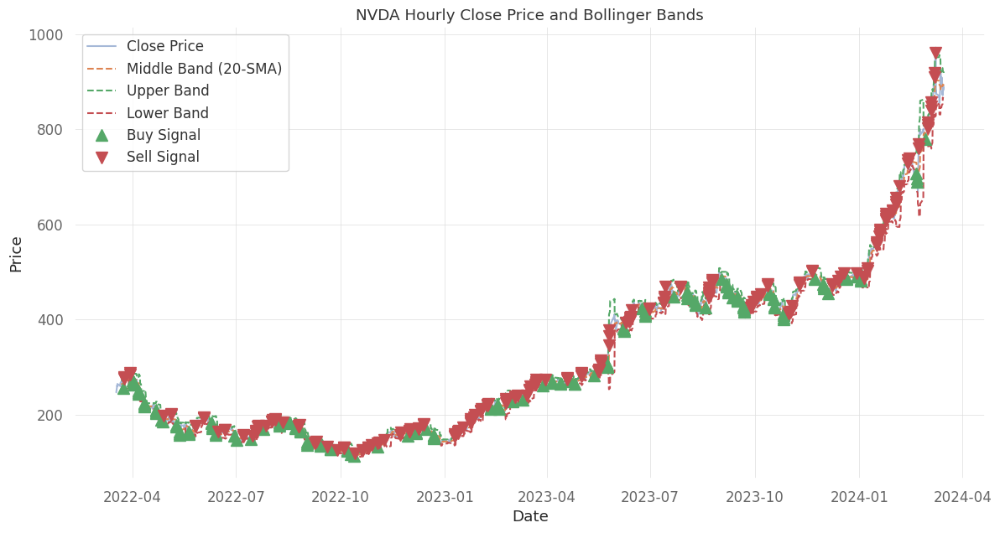

In [ ]:
# Plot the strategy
plt.figure(figsize=(14, 7))

plt.plot(hourly_nvda['Adj Close'], label='Close Price', alpha=0.5)
plt.plot(hourly_nvda['middle_band'], label='Middle Band (20-SMA)', linestyle='--')
plt.plot(hourly_nvda['upper_band'], label='Upper Band', linestyle='--')
plt.plot(hourly_nvda['lower_band'], label='Lower Band', linestyle='--')

# Highlight buy and sell signals
plt.plot(hourly_nvda.loc[hourly_nvda['signal'] == 1].index,
         hourly_nvda['lower_band'][hourly_nvda['signal'] == 1],
         '^', markersize=10, color='g', lw=0, label='Buy Signal')

plt.plot(hourly_nvda.loc[hourly_nvda['signal'] == -1].index,
         hourly_nvda['upper_band'][hourly_nvda['signal'] == -1],
         'v', markersize=10, color='r', lw=0, label='Sell Signal')

plt.title('NVDA Hourly Close Price and Bollinger Bands')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

In [ ]:
buy_signals = hourly_nvda[hourly_nvda['signal'] == 1]
sell_signals = hourly_nvda[hourly_nvda['signal'] == -1]

In [ ]:
fig = go.Figure()

# Add Close Price trace
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['Adj Close'], mode='lines', name='Close Price'))

# Add Bollinger Bands traces
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['upper_band'], line=dict(color='rgba(250, 0, 0, 0.75)'), name='Upper Band'))
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['middle_band'], line=dict(color='rgba(0, 0, 250, 0.75)'), name='Middle Band'))
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['lower_band'], line=dict(color='rgba(250, 0, 0, 0.75)'), name='Lower Band', fill='tonexty', fillcolor='rgba(250, 0, 0, 0.2)'))

# Add Buy signals trace
fig.add_trace(go.Scatter(x=buy_signals.index, y=buy_signals['Adj Close'], mode='markers', marker=dict(color='Green', size=10, symbol='triangle-up'), name='Buy Signal'))

# Add Sell signals trace
fig.add_trace(go.Scatter(x=sell_signals.index, y=sell_signals['Adj Close'], mode='markers', marker=dict(color='Red', size=10, symbol='triangle-down'), name='Sell Signal'))

# Update layout
fig.update_layout(title='NVDA Hourly Close Price and Bollinger Bands', xaxis_title='Date', yaxis_title='Price', template='plotly_dark')

fig.show()
fig.write_html("nvda_bb.html")

In [ ]:
def calculate_supertrend(df, period=7, multiplier=3):
    hl2 = (df['High'] + df['Low']) / 2
    atr = 'ATR_' + str(period)
    df[atr] = hl2.rolling(window=period).mean()
    df[atr] = df[atr].fillna(method='bfill')

    st = 'SuperTrend_' + str(period) + '_' + str(multiplier)
    df[st] = 0.0

    for i in range(1, len(df)):
        if df['Close'][i] > df[st][i - 1]:
            df[st][i] = hl2[i] + (multiplier * df[atr][i])
        else:
            df[st][i] = hl2[i] - (multiplier * df[atr][i])

    df[st] = df[st].shift(1)
    return df

# Assuming 'hourly_nvda' is your DataFrame
hourly_nvda = calculate_supertrend(hourly_nvda)

# Generating signals
hourly_nvda['signal'] = 0
hourly_nvda.loc[hourly_nvda['Close'] > hourly_nvda['SuperTrend_7_3'], 'signal'] = 1
hourly_nvda.loc[hourly_nvda['Close'] < hourly_nvda['SuperTrend_7_3'], 'signal'] = -1

# Assuming you want to calculate returns similar to your RSI strategy:
hourly_nvda['returns'] = hourly_nvda['Close'].pct_change()
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

initial_capital = 100
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital

# Calculate and print metrics
num_trades = hourly_nvda['signal'].abs().sum()
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

print(f"Number of trades: {num_trades}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")

Number of trades: 3491
Initial capital: $100
Final capital: $56.24
Total return: -43.76%


In [ ]:
n = 10  # Number of periods used to calculate momentum

# Calculate momentum
hourly_nvda['momentum'] = hourly_nvda['Adj Close'] - hourly_nvda['Adj Close'].shift(n)

# Generate signals: buy (1) when momentum is positive, sell (-1) when negative
hourly_nvda['signal'] = 0
hourly_nvda.loc[hourly_nvda['momentum'] > 0, 'signal'] = 1
hourly_nvda.loc[hourly_nvda['momentum'] < 0, 'signal'] = -1

# Calculate daily returns
hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()

# Apply the strategy
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']

# Calculate cumulative returns of the strategy
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

# Setting the initial capital to $100
initial_capital = 100

# Calculating total portfolio value
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital

# Printing the number of trades, initial capital, and final capital
num_trades = hourly_nvda['signal'].abs().sum()
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

print('\n')
print(f"Number of trades: {num_trades}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")
print('\n')



Number of trades: 3482
Initial capital: $100
Final capital: $69.78
Total return: -30.22%




In [ ]:
# Parameters for the Greedy Strategy
buy_threshold = 0.15  # 5% increase from previous day
sell_threshold = -0.05  # 5% decrease from peak value after buying

hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()
hourly_nvda['signal'] = 0
holding = False
peak = None

for i in range(1, len(hourly_nvda)):
    if not holding:
        # Buy if the stock increased by more than buy_threshold
        if hourly_nvda['returns'].iloc[i] > buy_threshold:
            hourly_nvda['signal'].iloc[i] = 1
            holding = True
            peak = hourly_nvda['Adj Close'].iloc[i]
    else:
        current_price = hourly_nvda['Adj Close'].iloc[i]
        if current_price > peak:
            peak = current_price
        # Sell if the stock decreases by sell_threshold from its peak
        if (current_price - peak) / peak < sell_threshold:
            hourly_nvda['signal'].iloc[i] = -1
            holding = False

# Applying the strategy
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

# Calculating performance
initial_capital = 100
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital
num_trades = hourly_nvda['signal'].abs().sum()
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

print('\n')
print(f"Number of trades: {num_trades}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")
print('\n')



Number of trades: 4
Initial capital: $100
Final capital: $104.03
Total return: 4.03%




In [ ]:
# Plot the adjusted close price
fig = go.Figure()
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['Adj Close'], mode='lines', name='Adj Close'))

# Highlight buy signals
buy_signals = hourly_nvda[hourly_nvda['signal'] == 1]
fig.add_trace(go.Scatter(x=buy_signals.index, y=buy_signals['Adj Close'], mode='markers', marker=dict(color='Green', size=10, symbol='triangle-up'), name='Buy'))

# Highlight sell signals
sell_signals = hourly_nvda[hourly_nvda['signal'] == -1]
fig.add_trace(go.Scatter(x=sell_signals.index, y=sell_signals['Adj Close'], mode='markers', marker=dict(color='Red', size=10, symbol='triangle-down'), name='Sell'))

# Optionally, add a trace for portfolio value if you want to visualize how the strategy's performance evolves over time
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['portfolio_value'], mode='lines', name='Portfolio Value'))

fig.update_layout(title='Greedy Strategy: NVDA Hourly Trading Signals', xaxis_title='Date', yaxis_title='Price', template='plotly_dark')
fig.show()
fig.write_html("nvda_greedy.html")

In [ ]:
hourly_nvda

,Open,High,Low,Close,Adj Close,Volume,rsi,signal,returns,cumulative_returns,...,macd,signal_line,SMA,std_dev,upper_band,lower_band,middle_band,ATR_7,SuperTrend_7_3,momentum
Datetime,,,,,,,,,,,,,,,,,,,,,
2022-03-17 14:30:00-04:00,244.250000,247.369995,244.250000,247.000107,247.000107,0,NaN,0,NaN,NaN,...,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,255.732135,NaN,NaN
2022-03-17 15:30:00-04:00,247.039993,248.419998,246.139999,247.690002,247.690002,4653350,NaN,0,0.002793,0.002793,...,0.055034,0.011007,NaN,NaN,NaN,NaN,NaN,255.732135,0.000000,NaN
2022-03-18 09:30:00-04:00,247.990005,262.559998,246.240005,260.839996,260.839996,20688940,NaN,0,0.053091,0.056032,...,1.146528,0.238111,NaN,NaN,NaN,NaN,NaN,255.732135,1014.476404,NaN
2022-03-18 10:30:00-04:00,260.864990,262.559998,256.640015,261.255005,261.255005,11742185,NaN,0,0.001591,0.057712,...,2.021727,0.594834,NaN,NaN,NaN,NaN,NaN,255.732135,-512.796404,NaN
2022-03-18 11:30:00-04:00,261.210114,262.209991,259.019989,259.765411,259.765411,6350868,NaN,0,-0.005702,0.051681,...,2.565556,0.988979,NaN,NaN,NaN,NaN,NaN,255.732135,1026.796412,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-03-14 13:30:00-04:00,871.960571,886.200012,870.609985,881.695007,881.695007,6601929,46.801383,0,0.011156,2.569614,...,-1.299223,1.902019,893.661212,15.426816,924.514845,862.807579,893.661212,888.004286,-1800.478559,-7.565002
2024-03-14 14:30:00-04:00,881.640015,883.939880,869.059998,873.919983,873.919983,6636584,43.730105,0,-0.008818,2.538136,...,-2.296578,1.062300,894.461212,13.805467,922.072146,866.850279,894.461212,883.353564,3542.417855,-16.395020
2024-03-14 15:30:00-04:00,873.859985,881.049988,870.000000,880.359985,880.359985,4905027,46.841818,0,0.007369,2.564209,...,-2.538078,0.342224,894.189313,14.036684,922.262681,866.115944,894.189313,878.837847,-1773.560752,-22.960022


In [ ]:
short_window = 50
long_window = 200

# Calculate the moving averages
hourly_nvda['short_mavg'] = hourly_nvda['Adj Close'].rolling(window=short_window, min_periods=1).mean()
hourly_nvda['long_mavg'] = hourly_nvda['Adj Close'].rolling(window=long_window, min_periods=1).mean()

# Generate signals
hourly_nvda['signal'] = 0
# Buy signal
hourly_nvda.loc[hourly_nvda['short_mavg'] > hourly_nvda['long_mavg'], 'signal'] = 1
# Sell signal
hourly_nvda.loc[hourly_nvda['short_mavg'] < hourly_nvda['long_mavg'], 'signal'] = -1

# Calculate daily returns
hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()

# Apply the strategy
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']

# Calculate cumulative returns of the strategy
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

# Setting the initial capital to $100
initial_capital = 100

# Calculating total portfolio value
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital

# Printing the results
num_trades = hourly_nvda['signal'].abs().sum()
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

print('\n')
print(f"Number of trades: {num_trades}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")
print('\n')



Number of trades: 3442
Initial capital: $100
Final capital: $243.96
Total return: 143.96%




In [ ]:

# Calculate moving averages
short_window = 20
long_window = 50
hourly_nvda['short_mavg'] = hourly_nvda['Adj Close'].rolling(window=short_window, min_periods=1).mean()
hourly_nvda['long_mavg'] = hourly_nvda['Adj Close'].rolling(window=long_window, min_periods=1).mean()

# Generate signals
hourly_nvda['signal'] = 0
hourly_nvda['signal'][short_window:] = np.where(hourly_nvda['short_mavg'][short_window:] > hourly_nvda['long_mavg'][short_window:], 1, 0)
hourly_nvda['positions'] = hourly_nvda['signal'].diff()

# Plotting
fig = go.Figure()

# Plot Adjusted Closing Price and Moving Averages
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['Adj Close'], mode='lines', name='Adj Close', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['short_mavg'], mode='lines', name=f'Short {short_window}-SMA', line=dict(color='red')))
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['long_mavg'], mode='lines', name=f'Long {long_window}-SMA', line=dict(color='green')))

# Highlight Buy signals
fig.add_trace(go.Scatter(x=hourly_nvda[hourly_nvda['positions'] == 1].index,
                         y=hourly_nvda['short_mavg'][hourly_nvda['positions'] == 1],
                         mode='markers', marker_symbol='triangle-up', marker_line_color="green", marker_color="green",
                         marker_line_width=2, marker_size=10, name='Buy Signal'))

# Highlight Sell signals
fig.add_trace(go.Scatter(x=hourly_nvda[hourly_nvda['positions'] == -1].index,
                         y=hourly_nvda['short_mavg'][hourly_nvda['positions'] == -1],
                         mode='markers', marker_symbol='triangle-down', marker_line_color="red", marker_color="red",
                         marker_line_width=2, marker_size=10, name='Sell Signal'))

# Update layout
fig.update_layout(title='NVDA Trend Following Strategy', xaxis_title='Date', yaxis_title='Price', template='plotly_dark')

fig.show()
fig.write_html("nvda_trend.html")


In [ ]:
breakout_window = 20

# Calculate the rolling max and min for the breakout window
hourly_nvda['20_day_high'] = hourly_nvda['Adj Close'].rolling(window=breakout_window).max()
hourly_nvda['20_day_low'] = hourly_nvda['Adj Close'].rolling(window=breakout_window).min()

# Generate signals
# Buy signal when the close price breaks above the 20-day high
hourly_nvda['signal'] = 0
hourly_nvda.loc[hourly_nvda['Adj Close'] > hourly_nvda['20_day_high'].shift(1), 'signal'] = 1

# Sell signal when the close price breaks below the 20-day low
hourly_nvda.loc[hourly_nvda['Adj Close'] < hourly_nvda['20_day_low'].shift(1), 'signal'] = -1

# Assuming you will close your position at the next signal, calculate the returns
hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

# Calculate initial capital and final portfolio value
initial_capital = 100
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

# Print results
print(f"Number of trades: {hourly_nvda['signal'].abs().sum()}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")

Number of trades: 911
Initial capital: $100
Final capital: $114.23
Total return: 14.23%


In [ ]:
import plotly.graph_objects as go

# Plot the adjusted close price
fig = go.Figure()
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['Adj Close'], mode='lines', name='Adj Close', line=dict(color='blue')))

# Highlight the 20-day high and low as the breakout levels
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['20_day_high'], mode='lines', name='20-Day High', line=dict(color='red', dash='dot')))
fig.add_trace(go.Scatter(x=hourly_nvda.index, y=hourly_nvda['20_day_low'], mode='lines', name='20-Day Low', line=dict(color='green', dash='dot')))

# Mark buy signals
buy_signals = hourly_nvda[hourly_nvda['signal'] == 1]
fig.add_trace(go.Scatter(x=buy_signals.index, y=buy_signals['Adj Close'], mode='markers', marker_symbol='triangle-up', marker_line_color="green", marker_color="green", marker_line_width=2, marker_size=10, name='Buy Signal'))

# Mark sell signals
sell_signals = hourly_nvda[hourly_nvda['signal'] == -1]
fig.add_trace(go.Scatter(x=sell_signals.index, y=sell_signals['Adj Close'], mode='markers', marker_symbol='triangle-down', marker_line_color="red", marker_color="red", marker_line_width=2, marker_size=10, name='Sell Signal'))

# Update layout
fig.update_layout(title='NVDA Breakout Strategy Visualization', xaxis_title='Date', yaxis_title='Price', template='plotly_dark')

fig.show()
fig.write_html('nvda_breakout.html')

In [ ]:
# Calculate moving averages for the trend-following component
short_window = 20
long_window = 50
hourly_nvda['short_mavg'] = hourly_nvda['Adj Close'].rolling(window=short_window, min_periods=1).mean()
hourly_nvda['long_mavg'] = hourly_nvda['Adj Close'].rolling(window=long_window, min_periods=1).mean()

# Identify the trend direction
hourly_nvda['trend'] = 0
hourly_nvda.loc[hourly_nvda['short_mavg'] > hourly_nvda['long_mavg'], 'trend'] = 1
hourly_nvda.loc[hourly_nvda['short_mavg'] < hourly_nvda['long_mavg'], 'trend'] = -1

# Calculate the 20-day high and low for the breakout component
hourly_nvda['20_day_high'] = hourly_nvda['Adj Close'].rolling(window=20).max()
hourly_nvda['20_day_low'] = hourly_nvda['Adj Close'].rolling(window=20).min()

# Initialize the signal column
hourly_nvda['signal'] = 0

# Generate combined signals
# Buy signal: If price breaks above 20-day high and the trend is positive
hourly_nvda.loc[(hourly_nvda['Adj Close'] > hourly_nvda['20_day_high'].shift(1)) & (hourly_nvda['trend'] == 1), 'signal'] = 1

# Sell signal: If price breaks below 20-day low and the trend is negative
hourly_nvda.loc[(hourly_nvda['Adj Close'] < hourly_nvda['20_day_low'].shift(1)) & (hourly_nvda['trend'] == -1), 'signal'] = -1

# Calculate strategy returns
hourly_nvda['returns'] = hourly_nvda['Adj Close'].pct_change()
hourly_nvda['strategy_returns'] = hourly_nvda['signal'].shift(1) * hourly_nvda['returns']
hourly_nvda['cumulative_strategy_returns'] = (1 + hourly_nvda['strategy_returns']).cumprod() - 1

# Calculate initial capital and final portfolio value
initial_capital = 100
hourly_nvda['portfolio_value'] = (1 + hourly_nvda['strategy_returns']).cumprod() * initial_capital
final_capital = hourly_nvda['portfolio_value'].iloc[-1]
total_return = (final_capital - initial_capital) / initial_capital * 100

# Print results
print(f"Number of trades: {hourly_nvda['signal'].abs().sum()}")
print(f"Initial capital: ${initial_capital}")
print(f"Final capital: ${final_capital:.2f}")
print(f"Total return: {total_return:.2f}%")

Number of trades: 599
Initial capital: $100
Final capital: $111.33
Total return: 11.33%
